# Check paths

In [1]:
import os
from pathlib import Path

print(">>> listdir(/kaggle/input)")
for item in os.listdir("/kaggle/input"):
    p = Path("/kaggle/input") / item
    print("-", item, "| dir?", p.is_dir())
    if p.is_dir():
        # show files inside each model folder
        inner = os.listdir(p)
        print("   contents:", inner[:10])  # show first ~10 entries


>>> listdir(/kaggle/input)
- cub2002011 | dir? True
   contents: ['cvpr2016_cub', 'CUB_200_2011', 'segmentations']
- vit-classifier- | dir? True
   contents: ['pytorch']
- vit-autoencoder | dir? True
   contents: ['pytorch']


In [2]:
import os
from pathlib import Path

# Check vit-classifier-
clf_root = Path("/kaggle/input/vit-classifier-")
ae_root  = Path("/kaggle/input/vit-autoencoder")

print(">>> vit-classifier- contents:")
for item in os.listdir(clf_root):
    p = clf_root / item
    print("-", item, "| dir?", p.is_dir())
    if p.is_dir():
        print("   inner:", os.listdir(p)[:20])

print("\n>>> vit-classifier-/pytorch contents (if exists):")
clf_torch = clf_root / "pytorch"
if clf_torch.exists():
    for f in os.listdir(clf_torch):
        print("   -", f)

print("\n>>> vit-autoencoder contents:")
for item in os.listdir(ae_root):
    p = ae_root / item
    print("-", item, "| dir?", p.is_dir())
    if p.is_dir():
        print("   inner:", os.listdir(p)[:20])

print("\n>>> vit-autoencoder/pytorch contents (if exists):")
ae_torch = ae_root / "pytorch"
if ae_torch.exists():
    for f in os.listdir(ae_torch):
        print("   -", f)

print("\n>>> cub2002011 contents:")
cub_root = Path("/kaggle/input/cub2002011")
for item in os.listdir(cub_root):
    p = cub_root / item
    print("-", item, "| dir?", p.is_dir())
    if p.is_dir():
        print("   inner:", os.listdir(p)[:10])

>>> vit-classifier- contents:
- pytorch | dir? True
   inner: ['default']

>>> vit-classifier-/pytorch contents (if exists):
   - default

>>> vit-autoencoder contents:
- pytorch | dir? True
   inner: ['default']

>>> vit-autoencoder/pytorch contents (if exists):
   - default

>>> cub2002011 contents:
- cvpr2016_cub | dir? True
   inner: ['vocab_c10.t7', 'trainclasses.txt', 'manifest.txt', 'valids.txt', 'allclasses.txt', 'word_c10', 'testclasses.txt', 'bow_c10', 'trainvalclasses.txt', 'trainvalids.txt']
- CUB_200_2011 | dir? True
   inner: ['images.txt', 'train_test_split.txt', 'image_class_labels.txt', 'README', 'parts', 'images', 'classes.txt', 'attributes', 'bounding_boxes.txt']
- segmentations | dir? True
   inner: ['037.Acadian_Flycatcher', '145.Elegant_Tern', '115.Brewer_Sparrow', '125.Lincoln_Sparrow', '063.Ivory_Gull', '073.Blue_Jay', '116.Chipping_Sparrow', '135.Bank_Swallow', '187.American_Three_toed_Woodpecker', '174.Palm_Warbler']


# Setup + Load Models (Classifier + AE)

ERROR: Could not find a version that satisfies the requirement timm==0.9.10 (from versions: none)
ERROR: No matching distribution found for timm==0.9.10


/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2225: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2225: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

Device: cuda
Found checkpoint : /kaggle/input/vit-classifier-/pytorch/default/1/vit_cls_best.pt
Found meta       : /kaggle/input/vit-classifier-/pytorch/default/1/meta_cls.json
Found labels     : /kaggle/input/vit-classifier-/pytorch/default/1/labels.txt
Found AE encoder : /kaggle/input/vit-autoencoder/pytorch/default/1/vit_ae_encoder.pt
Found AE decoder : /kaggle/input/vit-autoencoder/pytorch/default/1/vit_ae_decoder.pt
Found AE meta    : /kaggle/input/vit-autoencoder/pytorch/default/1/meta_ae.json
CUB_ROOT: /kaggle/input/cub2002011/CUB_200_2011
IMG_ROOT: /kaggle/input/cub2002011/CUB_200_2011/images
num_classes: 200
class 0 name: 001.Black footed Albatross
AE meta keys: ['encoder_timm_name', 'img_size', 'patch_size', 'num_patches', 'embed_dim', 'decoder_dim', 'decoder_depth', 'decoder_heads', 'out_channels', 'mean', 'std']
Classifier loaded 
AE encoder loaded 
AE decoder weights loaded (non-strict) 
 missing keys   : [] 
 unexpected keys: ['proj_in.weight', 'proj_in.bias', 'blocks.lay

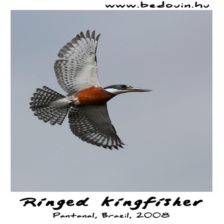

In [3]:
# CELL 1 — Setup + Load Models (Classifier + AE)


# (A) Install timm (safe if re-run)
!pip -q install timm==0.9.10

# (B) Imports & seeds
import os, json, glob, random, math
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as T

plt.rcParams["figure.figsize"] = (6,6)

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

# (C) Helper to auto-locate files inside /kaggle/input/** no matter nesting
def find_one(pattern):
    hits = glob.glob(pattern, recursive=True)
    return hits[0] if len(hits) > 0 else None

# --- Classifier assets ---
CKPT_PATH    = find_one("/kaggle/input/**/vit_cls_best.pt")   # classifier weights
META_PATH    = find_one("/kaggle/input/**/meta_cls.json")     # classifier meta (id2label, mean/std)
LABELS_PATH  = find_one("/kaggle/input/**/labels.txt")        # optional textual labels file

print("Found checkpoint :", CKPT_PATH)
print("Found meta       :", META_PATH)
print("Found labels     :", LABELS_PATH)

assert CKPT_PATH and META_PATH and LABELS_PATH, "Missing one of {vit_cls_best.pt, meta_cls.json, labels.txt}"

# --- Autoencoder assets ---
AE_ENCODER_PATH = find_one("/kaggle/input/**/vit_ae_encoder.pt")
AE_DECODER_PATH = find_one("/kaggle/input/**/vit_ae_decoder.pt")
AE_META_PATH    = find_one("/kaggle/input/**/meta_ae.json")

print("Found AE encoder :", AE_ENCODER_PATH)
print("Found AE decoder :", AE_DECODER_PATH)
print("Found AE meta    :", AE_META_PATH)

assert AE_ENCODER_PATH and AE_DECODER_PATH and AE_META_PATH, "Missing AE pieces"

# --- Dataset root (CUB_200_2011/images/...) ---
CUB_ROOT = find_one("/kaggle/input/cub2002011/CUB_200_2011")
assert CUB_ROOT is not None, "CUB_200_2011 not found under /kaggle/input/cub2002011"
CUB_ROOT = Path(CUB_ROOT)
IMG_ROOT = CUB_ROOT / "images"
print("CUB_ROOT:", CUB_ROOT)
print("IMG_ROOT:", IMG_ROOT)

# (D) Read classifier metadata
with open(META_PATH, "r") as f:
    cls_meta = json.load(f)

# IMPORTANT: in your files id2label is a LIST, not a dict
# index i -> class name string
id2label_list = cls_meta["id2label"]          # e.g. ["Spotted Catbird", "Green Violetear", ...]
mean = cls_meta.get("mean", [0.485, 0.456, 0.406])
std  = cls_meta.get("std",  [0.229, 0.224, 0.225])

num_classes = len(id2label_list)
print("num_classes:", num_classes)
print("class 0 name:", id2label_list[0] if num_classes > 0 else "N/A")

# (E) Read AE meta (just to confirm file is valid)
with open(AE_META_PATH, "r") as f:
    ae_meta = json.load(f)
print("AE meta keys:", list(ae_meta.keys()))

# (F) Transforms
transform_img = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.Normalize(mean=mean, std=std),
])

unnormalize_for_vis = T.Normalize(
    mean=[-m/s for m,s in zip(mean,std)],
    std=[1/s for s in std],
)

def load_and_preprocess_image(img_path: Path):
    """
    img_path -> (img_batch, pil_224)
      img_batch: [1,3,224,224] normalized for ViT on DEVICE
      pil_224  : resized PIL for vis
    """
    pil = Image.open(img_path).convert("RGB")
    pil_224 = pil.resize((224,224), Image.BILINEAR)
    img_t = transform_img(pil)
    img_t = img_t.unsqueeze(0).to(DEVICE)
    return img_t, pil_224

def tensor_to_pil(t: torch.Tensor):
    """convert normalized tensor -> displayable PIL"""
    if t.dim() == 4:
        t = t[0]
    x = unnormalize_for_vis(t.detach().cpu()).clamp(0,1)
    x = (x.permute(1,2,0).numpy()*255).astype(np.uint8)
    return Image.fromarray(x)

def show_side_by_side(pil_a, pil_b, title_a="original", title_b="counterfactual"):
    fig, ax = plt.subplots(1,2, figsize=(8,4))
    ax[0].imshow(pil_a); ax[0].set_title(title_a); ax[0].axis("off")
    ax[1].imshow(pil_b); ax[1].set_title(title_b); ax[1].axis("off")
    plt.show()

# (G) Build / load classifier ViT
vit_classifier = timm.create_model(
    "vit_base_patch16_224",
    pretrained=False,
    num_classes=num_classes,
)

state_cls = torch.load(CKPT_PATH, map_location=DEVICE)
vit_classifier.load_state_dict(state_cls, strict=True)
vit_classifier.to(DEVICE).eval()
print("Classifier loaded ")

# (H) Build / load AE encoder
vit_encoder_for_ae = timm.create_model(
    "vit_base_patch16_224",
    pretrained=False,
    num_classes=0,   # feature extractor only
)

state_enc = torch.load(AE_ENCODER_PATH, map_location=DEVICE)
vit_encoder_for_ae.load_state_dict(state_enc, strict=False)
vit_encoder_for_ae.to(DEVICE).eval()
print("AE encoder loaded ")

# AE decoder stub (we'll wire forward later for MI step)
class AEDecoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.dummy = nn.Identity()
    def forward(self, *args, **kwargs):
        raise RuntimeError("Decoder forward not implemented yet.")

ae_decoder = AEDecoder()
state_dec = torch.load(AE_DECODER_PATH, map_location=DEVICE)
missing, unexpected = ae_decoder.load_state_dict(state_dec, strict=False)

print("AE decoder weights loaded (non-strict) ")
print(" missing keys   :", missing[:5], "..." if len(missing)>5 else "")
print(" unexpected keys:", unexpected[:5], "..." if len(unexpected)>5 else "")

ae_decoder.to(DEVICE).eval()

# (I) helper: run classifier on an image
@torch.no_grad()
def get_logits_and_pred(model, img_batch):
    logits = model(img_batch)             # [1,C]
    probs  = logits.softmax(dim=1)        # [1,C]
    conf, idx = probs.max(dim=1)
    idx  = idx.item()
    conf = conf.item()
    # map idx -> human-readable class name
    pred_name = id2label_list[idx] if idx < len(id2label_list) else f"class_{idx}"
    return logits, idx, pred_name, conf

# (J) Smoke test on any random bird from dataset
all_imgs = list(IMG_ROOT.rglob("*.jpg"))
print("Total dataset images found:", len(all_imgs))
assert len(all_imgs) > 0, "No .jpg images found in CUB_200_2011/images"

test_img_path = random.choice(all_imgs)
print("Testing on:", test_img_path)

img_batch, pil_224 = load_and_preprocess_image(test_img_path)
logits, idx, name, conf = get_logits_and_pred(vit_classifier, img_batch)

print(f"Prediction -> class_id={idx} | name={name} | conf={conf:.3f}")
display(pil_224)

# Visualization of samples of any class 

Classifier class id : 137
CUB txt class id    : 138
Class name          : 138.Tree Swallow
Total images for this class: 60


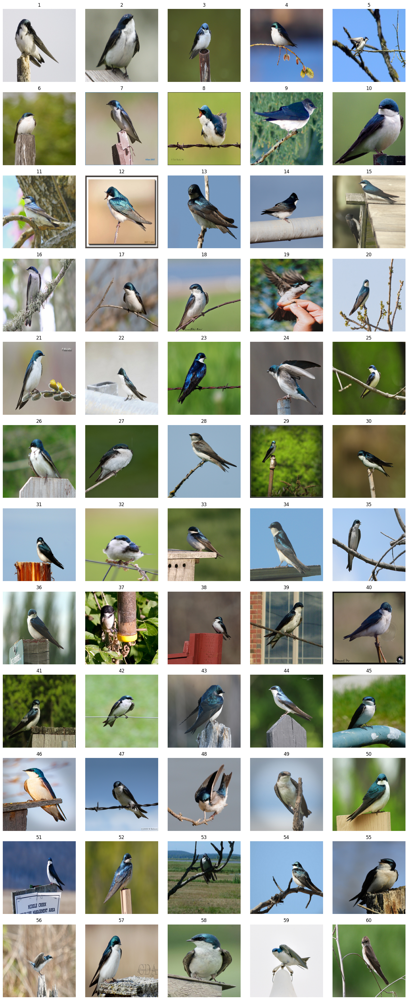

In [15]:
# CELL — Show all images for a given class ID (CUB_200_2011)
# NOTE: assumes CUB_ROOT, IMG_ROOT, id2label_list already defined in previous cells.

import math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# ---------------------------------------------------
# 1) Choose class id (classifier index: 0..num_classes-1)
#    Example: 191  -> "192.Downy Woodpecker"
# ---------------------------------------------------
target_cls_id = 137   # <-- yahan apna class id daalo

# CUB ke txt files me class IDs 1..200 hote hain,
# is liye hum +1 offset use kar rahe hain.
CUB_LABEL_OFFSET = 1
cub_class_id = target_cls_id + CUB_LABEL_OFFSET

# ---------------------------------------------------
# 2) Read CUB mapping files:
#    images.txt            : image_id  relative_path
#    image_class_labels.txt: image_id  class_id
# ---------------------------------------------------
img_list_file  = CUB_ROOT / "images.txt"
img_label_file = CUB_ROOT / "image_class_labels.txt"

id2path = {}
with open(img_list_file, "r") as f:
    for line in f:
        img_id_str, rel_path = line.strip().split()
        id2path[int(img_id_str)] = rel_path

id2cls = {}
with open(img_label_file, "r") as f:
    for line in f:
        img_id_str, cls_id_str = line.strip().split()
        id2cls[int(img_id_str)] = int(cls_id_str)

# ---------------------------------------------------
# 3) Collect all image paths for this class
# ---------------------------------------------------
img_paths = [
    IMG_ROOT / id2path[img_id]
    for img_id, c_id in id2cls.items()
    if c_id == cub_class_id
]

print(f"Classifier class id : {target_cls_id}")
print(f"CUB txt class id    : {cub_class_id}")
if 0 <= target_cls_id < len(id2label_list):
    print("Class name          :", id2label_list[target_cls_id])
print(f"Total images for this class: {len(img_paths)}")

# ---------------------------------------------------
# 4) Show images in a grid (all resized to 224×224)
# ---------------------------------------------------
max_show = 60   # agar sari dikhani hon to isko len(img_paths) se replace kar do
n_show = min(len(img_paths), max_show)

if n_show == 0:
    print("No images found for this class id.")
else:
    cols = 5
    rows = math.ceil(n_show / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(3*cols, 3*rows))
    axes = np.array(axes).reshape(-1)

    for i in range(rows*cols):
        ax = axes[i]
        ax.axis("off")
        if i < n_show:
            img = Image.open(img_paths[i]).convert("RGB")
            # --- IMPORTANT: resize to 224x224 ---
            img = img.resize((224, 224))
            ax.imshow(img)
            ax.set_title(f"{i+1}")

    plt.tight_layout()
    plt.show()


# MC Step: (Identify MC Heads From last block only)

MC Step on image: /kaggle/input/cub2002011/CUB_200_2011/images/082.Ringed_Kingfisher/Ringed_Kingfisher_0008_72943.jpg
[MC] Baseline -> class_id=81 | 082.Ringed Kingfisher | conf=0.869
Most Contributing heads: [6, 1, 4]
  head 6: logit drop = 0.5228
  head 1: logit drop = 0.1094
  head 4: logit drop = -0.0457


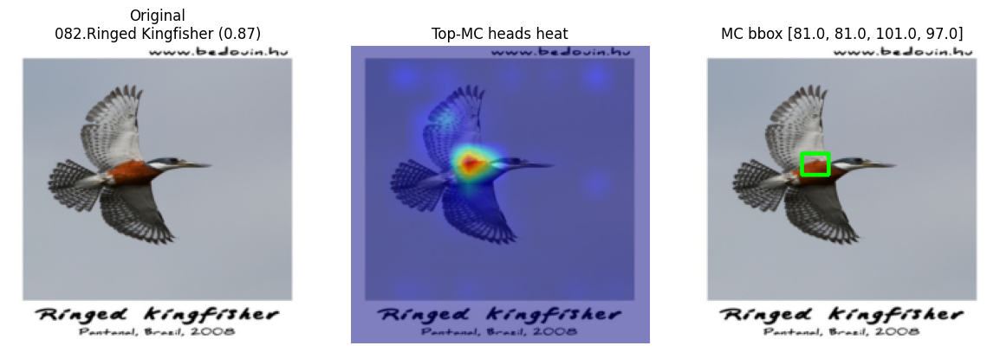


Summary:
Pred class: 082.Ringed Kingfisher (81) conf=0.87
Most Contributing heads: [6, 1, 4]
Done (MC step)


In [4]:
# CELL 2 — MC (Most Contributing) visualization


import cv2
import math
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib import cm
from torchvision.ops import masks_to_boxes

vit_classifier.eval()



# Helper: single-block attention forward with optional head kill

def run_attention_extract(attn_module, x_in, kill_head_idx=None):
    """
    attn_module: blk.attn    (timm ViTAttention)
    x_in:        [B, N, D]   (tokens AFTER norm1)
    kill_head_idx: int or None
        if int, we zero ONLY that head's contribution to the final proj.
    returns:
        out_tokens:  [B, N, D]  (attn output after proj_drop)
        attn_weights:[B, H, N, N] softmax attention (per head)
    """
    B_, N_, C_ = x_in.shape
    # attn_module.qkv is linear -> [B, N, 3*dim]
    qkv = attn_module.qkv(x_in)                           # [B,N,3*dim]
    qkv = qkv.reshape(B_, N_, 3, attn_module.num_heads, attn_module.head_dim)
    qkv = qkv.permute(2,0,3,1,4)                          # [3,B,H,N,hdim]
    q, k, v = qkv[0], qkv[1], qkv[2]                      # each [B,H,N,hdim]

    # scaled dot-product attention
    attn_scores = (q @ k.transpose(-2,-1)) * attn_module.scale   # [B,H,N,N]
    attn_weights = attn_scores.softmax(dim=-1)                   # [B,H,N,N]
    attn_drop = attn_module.attn_drop(attn_weights)

    # attention * value
    out = attn_drop @ v                                         # [B,H,N,hdim]

    # ablation of one head before proj
    if kill_head_idx is not None and 0 <= kill_head_idx < out.shape[1]:
        out[:, kill_head_idx, :, :] = 0.0

    # merge heads back
    out = out.transpose(1,2).reshape(B_, N_, C_)                 # [B,N,D]
    out = attn_module.proj(out)                                  # [B,N,D]
    out = attn_module.proj_drop(out)                             # [B,N,D]

    return out, attn_weights



# Helper: forward whole ViT but we hijack ONLY the last block

def forward_with_optional_head_kill(model, img_batch, kill_head_idx=None):
    """
    model: vit_classifier (timm ViT)
    img_batch: [1,3,224,224] normalized
    kill_head_idx:
        - None  -> normal forward
        - int   -> ablate that single head in LAST transformer block
    returns:
        logits:        [1,C]
        attn_last:     [H,N,N]  attention weights from last block (no ablation case kept)
        tokens_last:   [1,N,D]  tokens after last block (pre final norm)
    """
    m = model
    B = img_batch.shape[0]

    # patch embedding
    x = m.patch_embed(img_batch)              # [B, num_patches, dim]
    cls_tok = m.cls_token.expand(B, -1, -1)   # [B,1,dim]
    x = torch.cat([cls_tok, x], dim=1)        # prepend CLS
    x = x + m.pos_embed
    x = m.pos_drop(x)

    # go through all but last block normally
    for blk in m.blocks[:-1]:
        x = blk(x)

    # last block manual (timm ViTBlock with attn + MLP)
    blk = m.blocks[-1]

    # first residual: x + attn(norm1(x))
    n1 = blk.norm1(x)
    attn_out, attn_weights = run_attention_extract(
        blk.attn, n1, kill_head_idx=kill_head_idx
    )
    x2 = x + attn_out

    # second residual: x2 + mlp(norm2(x2))
    x3 = x2 + blk.mlp(blk.norm2(x2))

    tokens_pre_norm = x3.clone()               # save tokens before final norm
    x_norm = m.norm(x3)                        # final norm
    cls_final = x_norm[:,0]                    # CLS token
    logits = m.head(cls_final)                 # classifier head

    # attn_weights: [B,H,N,N] -> squeeze batch
    attn_last = attn_weights[0].detach()       # [H,N,N]

    return logits, attn_last, tokens_pre_norm.detach()



# Heatmap + bbox utils

def heads_to_spatial_heat(attn_heads, head_indices, img_res=224, patch=16):
    """
    attn_heads:   [H,N,N] from last block
    head_indices: list[int]  heads we consider as MC
    Steps:
      - take CLS→patch attention row (row 0 -> cols 1..)
      - average selected heads
      - upsample 14x14 -> 224x224
    Return: heat [224,224] in [0,1]
    """
    H, N, _ = attn_heads.shape
    cls_to_all = attn_heads[:, 0, 1:]           # [H, 196]
    side = int(math.sqrt(cls_to_all.shape[1]))  # should be 14 for 224/16
    cls_maps = cls_to_all.reshape(H, side, side)  # [H,14,14]

    # pick heads that actually exist
    valid = [h for h in head_indices if 0 <= h < H]
    if len(valid) == 0:
        valid = list(range(H))  # fallback to all heads if list empty

    chosen = cls_maps[valid]               # [K,14,14]
    avg_map = chosen.mean(dim=0, keepdim=True)  # [1,14,14]

    up = F.interpolate(
        avg_map.unsqueeze(1).float(),      # [1,1,14,14]
        size=(img_res, img_res),
        mode="bilinear",
        align_corners=False
    ).squeeze(0).squeeze(0)                # [224,224]

    # normalize 0..1
    mn, mx = up.amin(), up.amax()
    heat = (up - mn) / (mx - mn + 1e-6)
    return heat.detach().cpu().numpy()


def overlay_heat_on_image(pil_img, heat, alpha_img=0.5, alpha_heat=0.5):
    """
    pil_img: PIL.Image (224x224)
    heat:    numpy [224,224] in [0,1]
    returns RGB uint8 overlay
    """
    base = np.array(pil_img.convert("RGB"))/255.0    # [224,224,3]
    cmap_rgb = cm.jet(heat)[..., :3]                 # apply jet colormap
    mix = alpha_img*base + alpha_heat*cmap_rgb
    mix = np.clip(mix, 0, 1)
    return (mix*255).astype(np.uint8)


def draw_bbox_from_heat(pil_img, heat, thr=0.6):
    """
    crude bbox from high-importance region.
    returns (img_with_box_rgb, [x1,y1,x2,y2] or None)
    """
    mask = (heat >= thr).astype(np.uint8)  # [224,224]
    if mask.sum() == 0:
        return np.array(pil_img), None

    mask_t = torch.from_numpy(mask[None,:,:])  # [1,H,W]
    box_xyxy = masks_to_boxes(mask_t)[0].tolist()  # [4]

    img_np = np.array(pil_img).copy()
    (x1,y1,x2,y2) = [int(v) for v in box_xyxy]

    # draw green rectangle with cv2
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    cv2.rectangle(img_bgr, (x1,y1), (x2,y2), (0,255,0), 2)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    return img_rgb, box_xyxy



# 1) Use the same random test image from Cell 1
#    (test_img_path, img_batch, pil_224 already built there)
#    If notebook restarted, rebuild them here:

try:
    _ = test_img_path
    _ = img_batch
    _ = pil_224
except NameError:
    # fallback if user ran this cell first
    all_imgs = list( (Path(CUB_ROOT)/"images").rglob("*.jpg") )
    test_img_path = random.choice(all_imgs)
    img_batch, pil_224 = load_and_preprocess_image(test_img_path)

print("MC Step on image:", test_img_path)


# 2) Baseline forward (no head kill)

with torch.no_grad():
    logits_base, attn_last_full, tokens_last_full = forward_with_optional_head_kill(
        vit_classifier, img_batch.to(DEVICE), kill_head_idx=None
    )
    probs_base = logits_base.softmax(dim=1)
    conf_base, pred_idx_base = probs_base.max(dim=1)
    pred_idx_base = pred_idx_base.item()
    conf_base = conf_base.item()

pred_name_base = (
    id2label_list[pred_idx_base]
    if pred_idx_base < len(id2label_list)
    else f"class_{pred_idx_base}"
)

print(f"[MC] Baseline -> class_id={pred_idx_base} | {pred_name_base} | conf={conf_base:.3f}")


# 3) For each head in last block, ablate and see logit drop

target_class = pred_idx_base
H = attn_last_full.shape[0]  # num heads
contrib_scores = []

with torch.no_grad():
    base_logit_tgt = logits_base[0, target_class].item()

    for h in range(H):
        logits_kill_h, _, _ = forward_with_optional_head_kill(
            vit_classifier, img_batch.to(DEVICE), kill_head_idx=h
        )
        logit_h = logits_kill_h[0, target_class].item()
        drop = base_logit_tgt - logit_h   # positive drop => killing hurt that class
        contrib_scores.append(drop)

contrib_scores = np.array(contrib_scores)          # [H]
head_order = np.argsort(-contrib_scores)           # sort desc by drop
topK = min(3, H)
mc_heads = head_order[:topK].tolist()              # e.g. [2,5,9]

print("Most Contributing heads:", mc_heads)
for rank, h in enumerate(mc_heads):
    print(f"  head {h}: logit drop = {contrib_scores[h]:.4f}")


# 4) Build heatmap from those MC heads

heat_mc = heads_to_spatial_heat(attn_last_full, mc_heads, img_res=224, patch=16)

overlay_img = overlay_heat_on_image(pil_224, heat_mc, alpha_img=0.5, alpha_heat=0.5)
boxed_img, box_xyxy = draw_bbox_from_heat(pil_224, heat_mc, thr=0.6)


# 5) Show visualization

fig, ax = plt.subplots(1,3, figsize=(12,4))

ax[0].imshow(pil_224)
ax[0].set_title(f"Original\n{pred_name_base} ({conf_base:.2f})")
ax[0].axis("off")

ax[1].imshow(overlay_img)
ax[1].set_title("Top-MC heads heat")
ax[1].axis("off")

ax[2].imshow(boxed_img)
if box_xyxy is not None:
    ax[2].set_title(f"MC bbox {box_xyxy}")
else:
    ax[2].set_title("MC bbox (none)")
ax[2].axis("off")

plt.tight_layout()
plt.show()

print("\nSummary:")
print(f"Pred class: {pred_name_base} ({pred_idx_base}) conf={conf_base:.2f}")
print("Most Contributing heads:", mc_heads)
print("Done (MC step)")

# Identify MC Heads from all Blocks of ViT

MC Step on image: /kaggle/input/cub2002011/CUB_200_2011/images/082.Ringed_Kingfisher/Ringed_Kingfisher_0008_72943.jpg
[MC] Baseline -> class_id=81 | 082.Ringed Kingfisher | conf=0.869


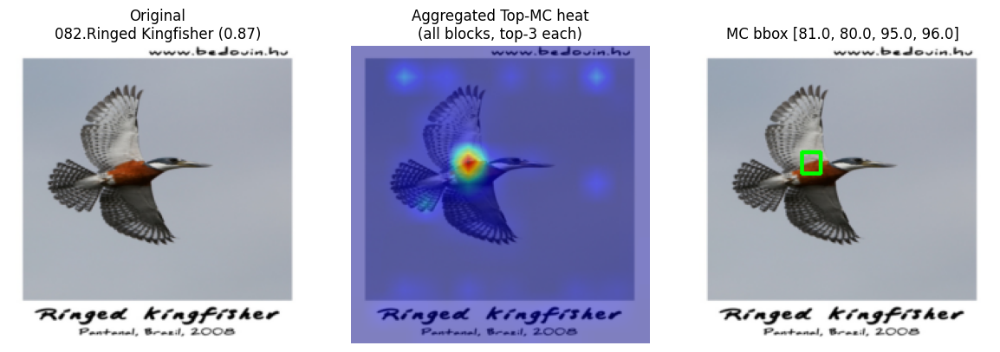


Summary:
Pred class: 082.Ringed Kingfisher (81) conf=0.87
Top-3 MC heads per block (by logit drop):
  Block 00: [7 (Δ=0.0549), 0 (Δ=0.0494), 3 (Δ=0.0275)]
  Block 01: [8 (Δ=0.0155), 7 (Δ=0.0091), 5 (Δ=0.0022)]
  Block 02: [7 (Δ=0.0322), 3 (Δ=0.0304), 4 (Δ=0.0173)]
  Block 03: [8 (Δ=0.1060), 7 (Δ=0.0483), 11 (Δ=0.0118)]
  Block 04: [6 (Δ=0.0544), 4 (Δ=0.0241), 1 (Δ=0.0176)]
  Block 05: [8 (Δ=0.0572), 11 (Δ=0.0462), 0 (Δ=0.0366)]
  Block 06: [7 (Δ=0.1020), 11 (Δ=0.0340), 2 (Δ=0.0234)]
  Block 07: [5 (Δ=0.0337), 2 (Δ=0.0226), 9 (Δ=-0.0073)]
  Block 08: [0 (Δ=0.4440), 10 (Δ=0.0858), 1 (Δ=0.0032)]
  Block 09: [2 (Δ=0.0399), 0 (Δ=0.0235), 8 (Δ=0.0233)]
  Block 10: [6 (Δ=0.5442), 0 (Δ=0.0789), 5 (Δ=0.0744)]
  Block 11: [6 (Δ=0.5228), 1 (Δ=0.1094), 4 (Δ=-0.0457)]
Done (MC across all blocks).


In [5]:
# CELL 2 — MC (Most Contributing) across ALL blocks (top-3 per block)


import cv2, math, random
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib import cm
from torchvision.ops import masks_to_boxes
from pathlib import Path

vit_classifier.eval()


# Helpers

def _attn_forward_block(attn_module, x_in, kill_head_idx=None):
    """Single attention block forward with optional one-head ablation."""
    B, N, C = x_in.shape
    qkv = attn_module.qkv(x_in)  # [B,N,3*dim]
    qkv = qkv.reshape(B, N, 3, attn_module.num_heads, attn_module.head_dim)
    qkv = qkv.permute(2, 0, 3, 1, 4)  # [3,B,H,N,hdim]
    q, k, v = qkv[0], qkv[1], qkv[2]  # [B,H,N,hdim]

    attn_scores = (q @ k.transpose(-2, -1)) * attn_module.scale  # [B,H,N,N]
    attn_weights = attn_scores.softmax(dim=-1)
    attn_drop = attn_module.attn_drop(attn_weights)

    out = attn_drop @ v  # [B,H,N,hdim]
    if kill_head_idx is not None and 0 <= kill_head_idx < out.shape[1]:
        out[:, kill_head_idx, :, :] = 0.0

    out = out.transpose(1, 2).reshape(B, N, C)     # [B,N,C]
    out = attn_module.proj(out)
    out = attn_module.proj_drop(out)
    return out, attn_weights

@torch.no_grad()
def forward_with_optional_kill(model, img_batch, kill_block_idx=None, kill_head_idx=None):
    """
    ViT forward; if kill_block_idx/head set, zero ONLY that head in that block's attn output.
    Returns:
        logits: [1,C]
        attn_per_block: list of [H,N,N] (baseline attn maps for each block, i.e., BEFORE any kill)
        tokens_pre_norm: [1,N,D] tokens before final norm
    """
    m = model
    B = img_batch.shape[0]

    # patch embed
    x = m.patch_embed(img_batch)
    cls_tok = m.cls_token.expand(B, -1, -1)
    x = torch.cat([cls_tok, x], dim=1)
    x = x + m.pos_embed
    x = m.pos_drop(x)

    attn_per_block = []

    # go through all blocks; if we're at kill_block_idx, ablate that single head
    for b_idx, blk in enumerate(m.blocks):
        n1 = blk.norm1(x)
        out_attn, aw = _attn_forward_block(
            blk.attn,
            n1,
            kill_head_idx=(kill_head_idx if (kill_block_idx == b_idx) else None)
        )
        x = x + out_attn
        x = x + blk.mlp(blk.norm2(x))
        # store the NON-ablated attention weights for visualization
        # (Use weights from the unmodified pass when b_idx != kill_block_idx; if equal,
        #  these are still fine for heat purposes since kill only zeros head after softmax*v.)
        attn_per_block.append(aw[0].detach())  # [H,N,N]

    tokens_pre_norm = x.clone()
    x_norm = m.norm(x)
    cls_final = x_norm[:, 0]
    logits = m.head(cls_final)
    return logits, attn_per_block, tokens_pre_norm

def heads_to_spatial_heat_multi(attn_blocks, selections_per_block, img_res=224):
    """
    Combine CLS->patch maps from selected heads across multiple blocks.
    attn_blocks: list of [H,N,N] (one per block)
    selections_per_block: dict {block_idx: [head_ids,...]}
    Returns heat [H,W] in [0,1].
    """
    maps = []
    for b_idx, heads_map in enumerate(attn_blocks):
        Hh, N, _ = heads_map.shape
        sel = [h for h in selections_per_block.get(b_idx, []) if 0 <= h < Hh]
        if not sel:
            continue
        cls_to_all = heads_map[:, 0, 1:]                  # [H, 196]
        side = int(math.sqrt(cls_to_all.shape[1]))        # 14 (ViT-B/16, 224px)
        cls_maps = cls_to_all.reshape(Hh, side, side)     # [H,14,14]
        m = cls_maps[sel].mean(dim=0, keepdim=True)       # [1,14,14]
        up = F.interpolate(m.unsqueeze(1).float(),
                           size=(img_res, img_res),
                           mode="bilinear", align_corners=False).squeeze()
        maps.append(up)
    if not maps:
        return np.zeros((img_res, img_res), dtype=np.float32)
    agg = torch.stack(maps, dim=0).mean(dim=0)  # average across blocks
    mn, mx = agg.amin(), agg.amax()
    heat = (agg - mn) / (mx - mn + 1e-6)
    return heat.detach().cpu().numpy()

def overlay_heat_on_image(pil_img, heat, alpha_img=0.5, alpha_heat=0.5):
    base = np.array(pil_img.convert("RGB")) / 255.0
    cmap_rgb = cm.jet(heat)[..., :3]
    mix = alpha_img * base + alpha_heat * cmap_rgb
    mix = np.clip(mix, 0, 1)
    return (mix * 255).astype(np.uint8)

def draw_bbox_from_heat(pil_img, heat, thr=0.6):
    mask = (heat >= thr).astype(np.uint8)
    if mask.sum() == 0:
        return np.array(pil_img), None
    box_xyxy = masks_to_boxes(torch.from_numpy(mask[None, ...]))[0].tolist()
    (x1, y1, x2, y2) = [int(v) for v in box_xyxy]
    img_np = np.array(pil_img).copy()
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), (0, 255, 0), 2)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb, box_xyxy


# Build input (reuse from Cell-1 if present)

try:
    _ = test_img_path; _ = img_batch; _ = pil_224
except NameError:
    all_imgs = list((Path(CUB_ROOT) / "images").rglob("*.jpg"))
    test_img_path = random.choice(all_imgs)
    img_batch, pil_224 = load_and_preprocess_image(test_img_path)

print("MC Step on image:", test_img_path)


# Baseline (no kill) — also collect attn per block

with torch.no_grad():
    logits_base, attn_blocks_base, tokens_last_full = forward_with_optional_kill(
        vit_classifier, img_batch.to(DEVICE),
        kill_block_idx=None, kill_head_idx=None
    )
    probs_base = logits_base.softmax(dim=1)
    conf_base, pred_idx_base = probs_base.max(dim=1)
    pred_idx_base = pred_idx_base.item()
    conf_base = conf_base.item()

pred_name_base = (
    id2label_list[pred_idx_base]
    if pred_idx_base < len(id2label_list)
    else f"class_{pred_idx_base}"
)
print(f"[MC] Baseline -> class_id={pred_idx_base} | {pred_name_base} | conf={conf_base:.3f}")


# Per-block head ablation → logit drop

target_class = pred_idx_base
num_blocks = len(vit_classifier.blocks)
topK_each = 3

with torch.no_grad():
    base_logit_tgt = logits_base[0, target_class].item()

mc_by_block = {}          # {block_idx: [top head ids]}
drop_scores_by_block = {} # {block_idx: [drops per head]}
for b_idx in range(num_blocks):
    Hheads = attn_blocks_base[b_idx].shape[0]
    drops = []
    for h in range(Hheads):
        logits_kill, _, _ = forward_with_optional_kill(
            vit_classifier, img_batch.to(DEVICE),
            kill_block_idx=b_idx, kill_head_idx=h
        )
        logit_h = logits_kill[0, target_class].item()
        drop = base_logit_tgt - logit_h  # positive => head important for this class
        drops.append(drop)
    drops = np.array(drops)                     # [Hheads]
    order = np.argsort(-drops)                  # desc
    topK = min(topK_each, Hheads)
    mc_heads_block = order[:topK].tolist()
    mc_by_block[b_idx] = mc_heads_block
    drop_scores_by_block[b_idx] = drops.tolist()


# Heatmap from ALL selected (block,head)

heat_mc = heads_to_spatial_heat_multi(attn_blocks_base, mc_by_block, img_res=224)
overlay_img = overlay_heat_on_image(pil_224, heat_mc, alpha_img=0.5, alpha_heat=0.5)
boxed_img, box_xyxy = draw_bbox_from_heat(pil_224, heat_mc, thr=0.6)


# Show visualization

fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(pil_224); ax[0].axis("off")
ax[0].set_title(f"Original\n{pred_name_base} ({conf_base:.2f})")

ax[1].imshow(overlay_img); ax[1].axis("off")
ax[1].set_title("Aggregated Top-MC heat\n(all blocks, top-3 each)")

ax[2].imshow(boxed_img); ax[2].axis("off")
ax[2].set_title(f"MC bbox {box_xyxy}" if box_xyxy is not None else "MC bbox (none)")
plt.tight_layout(); plt.show()


# Text summary

print("\nSummary:")
print(f"Pred class: {pred_name_base} ({pred_idx_base}) conf={conf_base:.2f}")
print("Top-3 MC heads per block (by logit drop):")
for b_idx in range(num_blocks):
    heads = mc_by_block[b_idx]
    drops = drop_scores_by_block[b_idx]
    pretty = ", ".join([f"{h} (Δ={drops[h]:.4f})" for h in heads])
    print(f"  Block {b_idx:02d}: [{pretty}]")
print("Done (MC across all blocks).")

# MC Heads identification from Random 5 images

Total dataset images found: 11796
Chosen images for MC batch:
 - /kaggle/input/cub2002011/CUB_200_2011/images/182.Yellow_Warbler/Yellow_Warbler_0057_176675.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/116.Chipping_Sparrow/Chipping_Sparrow_0053_109774.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/007.Parakeet_Auklet/Parakeet_Auklet_0047_795956.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/143.Caspian_Tern/Caspian_Tern_0123_145774.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/137.Cliff_Swallow/Cliff_Swallow_0084_133974.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/098.Scott_Oriole/Scott_Oriole_0079_92248.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/112.Great_Grey_Shrike/Great_Grey_Shrike_0044_106851.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/103.Sayornis/Sayornis_0025_98620.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/087.Mallard/Mallard_0025_76465.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/094.White_breasted_Nuthatch/White_B

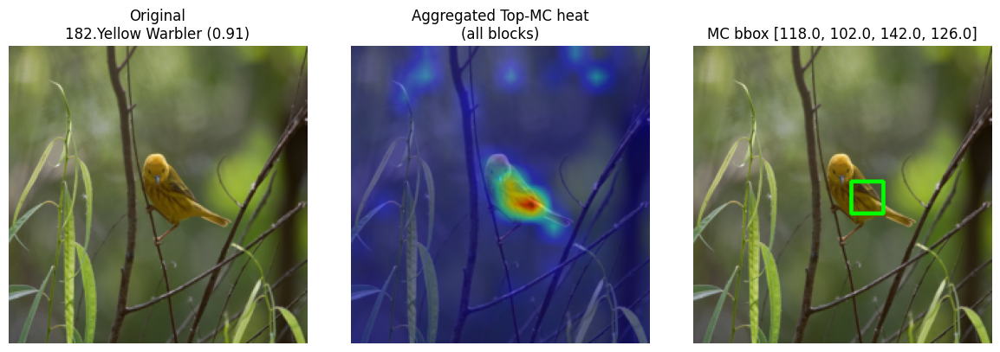


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/116.Chipping_Sparrow/Chipping_Sparrow_0053_109774.jpg
[MC] Baseline -> 115.116.Chipping Sparrow (conf=0.602)
[MC] After REMOVING MC heads (per-block top-3):
     -> 32.033.Yellow billed Cuckoo (conf=0.472)
     conf drop: 0.602 -> 0.472


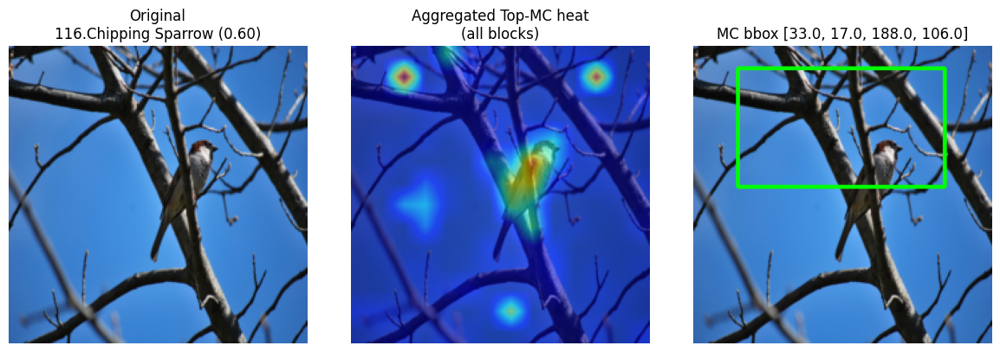


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/007.Parakeet_Auklet/Parakeet_Auklet_0047_795956.jpg
[MC] Baseline -> 6.007.Parakeet Auklet (conf=0.979)
[MC] After REMOVING MC heads (per-block top-3):
     -> 4.005.Crested Auklet (conf=0.132)
     conf drop: 0.979 -> 0.132


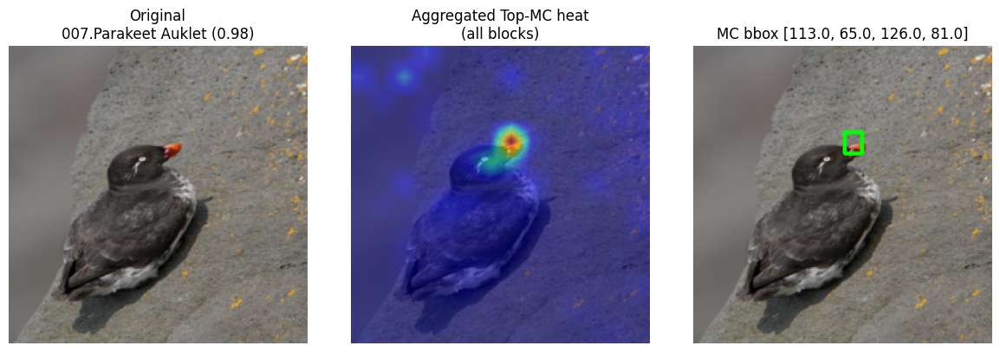


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/143.Caspian_Tern/Caspian_Tern_0123_145774.jpg
[MC] Baseline -> 142.143.Caspian Tern (conf=0.929)
[MC] After REMOVING MC heads (per-block top-3):
     -> 58.059.California Gull (conf=0.630)
     conf drop: 0.929 -> 0.630


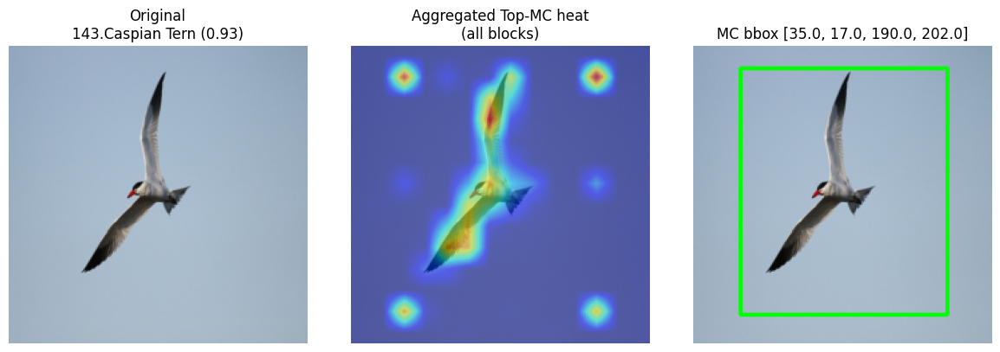


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/137.Cliff_Swallow/Cliff_Swallow_0084_133974.jpg
[MC] Baseline -> 39.040.Olive sided Flycatcher (conf=0.894)
[MC] After REMOVING MC heads (per-block top-3):
     -> 136.137.Cliff Swallow (conf=0.790)
     conf drop: 0.894 -> 0.790


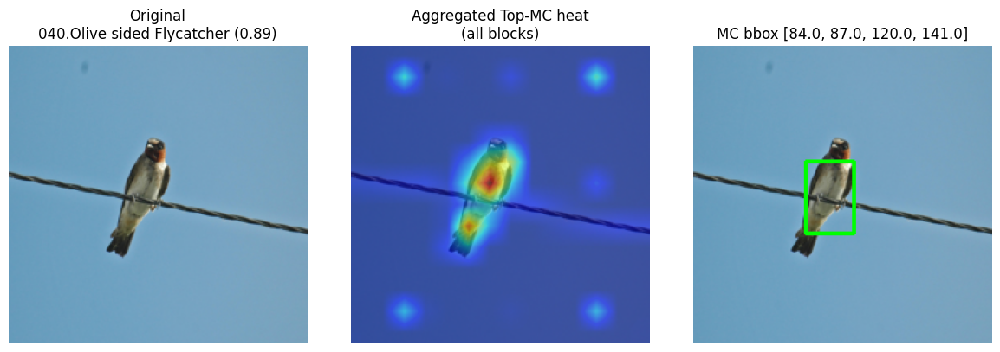


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/098.Scott_Oriole/Scott_Oriole_0079_92248.jpg
[MC] Baseline -> 97.098.Scott Oriole (conf=0.801)
[MC] After REMOVING MC heads (per-block top-3):
     -> 19.020.Yellow breasted Chat (conf=0.574)
     conf drop: 0.801 -> 0.574


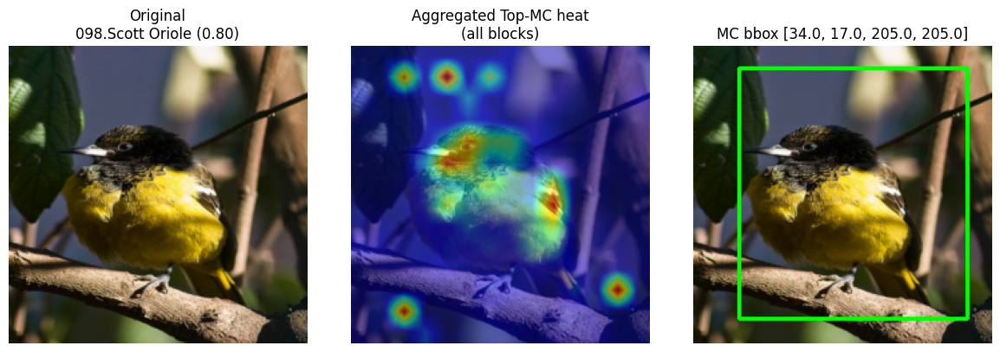


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/112.Great_Grey_Shrike/Great_Grey_Shrike_0044_106851.jpg
[MC] Baseline -> 111.112.Great Grey Shrike (conf=0.537)
[MC] After REMOVING MC heads (per-block top-3):
     -> 36.037.Acadian Flycatcher (conf=0.423)
     conf drop: 0.537 -> 0.423


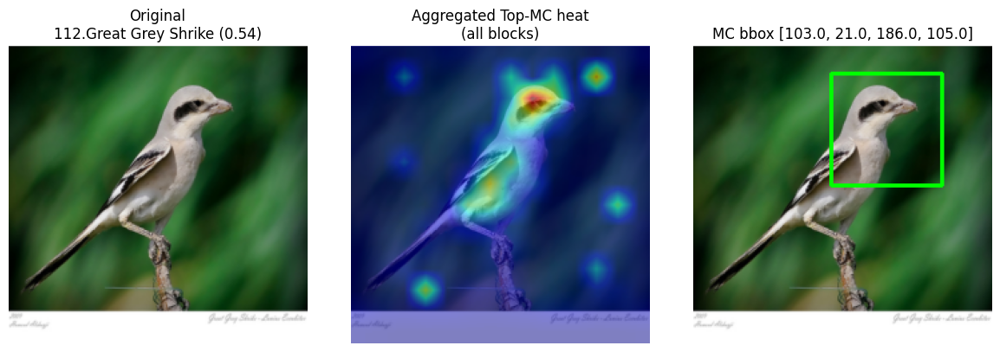


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/103.Sayornis/Sayornis_0025_98620.jpg
[MC] Baseline -> 102.103.Sayornis (conf=0.972)
[MC] After REMOVING MC heads (per-block top-3):
     -> 102.103.Sayornis (conf=0.252)
     conf drop: 0.972 -> 0.252


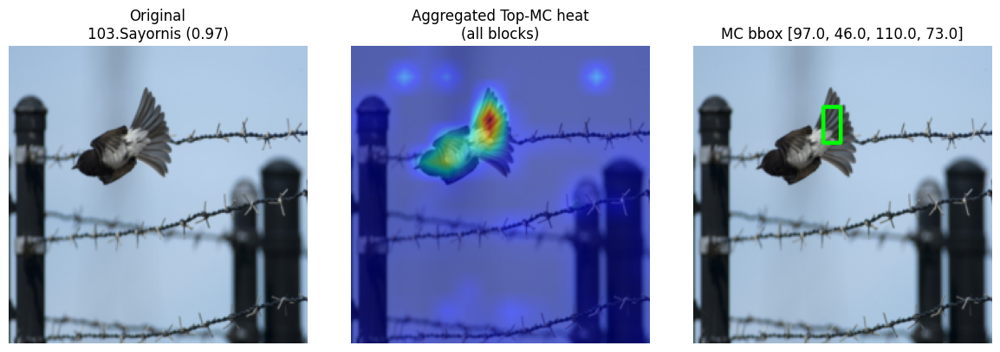


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/087.Mallard/Mallard_0025_76465.jpg
[MC] Baseline -> 86.087.Mallard (conf=0.919)
[MC] After REMOVING MC heads (per-block top-3):
     -> 165.166.Golden winged Warbler (conf=0.111)
     conf drop: 0.919 -> 0.111


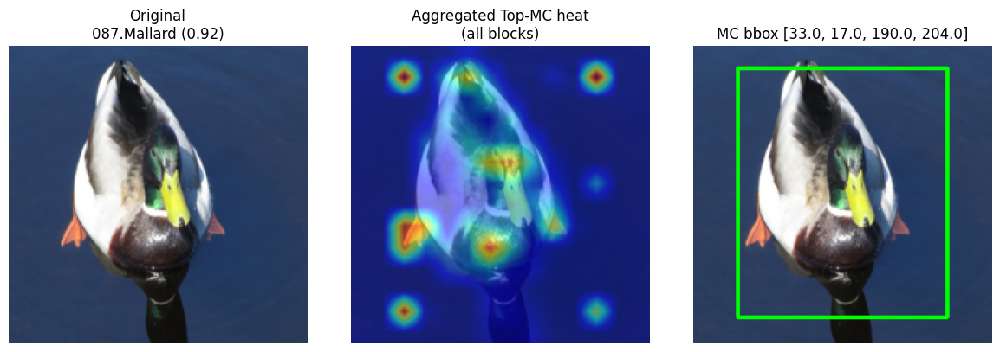


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/094.White_breasted_Nuthatch/White_Breasted_Nuthatch_0120_85890.jpg
[MC] Baseline -> 93.094.White breasted Nuthatch (conf=0.960)
[MC] After REMOVING MC heads (per-block top-3):
     -> 80.081.Pied Kingfisher (conf=0.094)
     conf drop: 0.960 -> 0.094


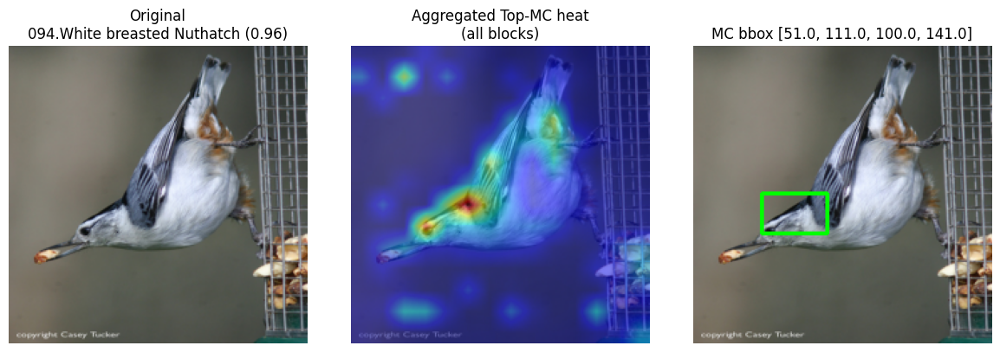


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/091.Mockingbird/Mockingbird_0003_80833.jpg
[MC] Baseline -> 90.091.Mockingbird (conf=0.837)
[MC] After REMOVING MC heads (per-block top-3):
     -> 101.102.Western Wood Pewee (conf=0.292)
     conf drop: 0.837 -> 0.292


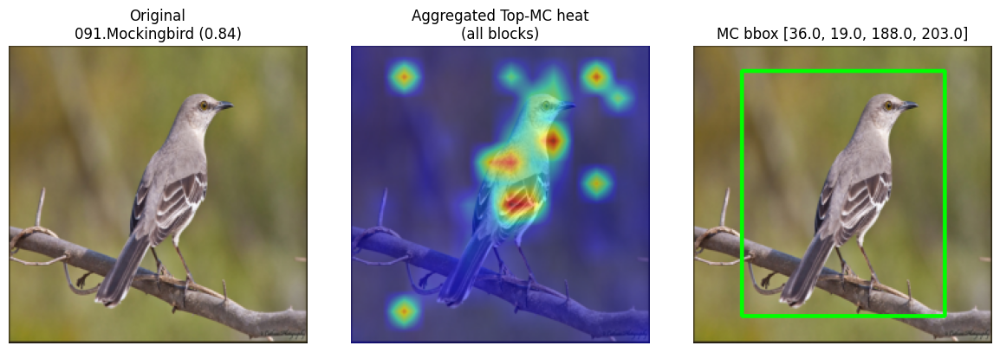


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/180.Wilson_Warbler/Wilson_Warbler_0070_175169.jpg
[MC] Baseline -> 179.180.Wilson Warbler (conf=0.855)
[MC] After REMOVING MC heads (per-block top-3):
     -> 179.180.Wilson Warbler (conf=0.170)
     conf drop: 0.855 -> 0.170


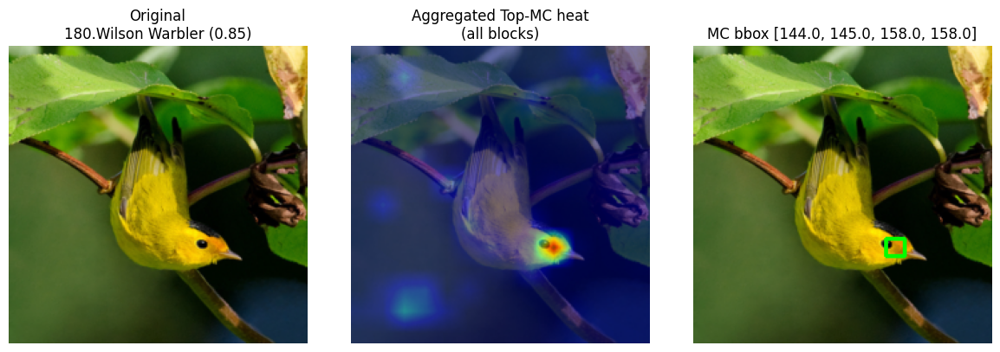


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/187.American_Three_toed_Woodpecker/American_Three_Toed_Woodpecker_0009_179919.jpg
[MC] Baseline -> 186.187.American Three toed Woodpecker (conf=0.973)
[MC] After REMOVING MC heads (per-block top-3):
     -> 186.187.American Three toed Woodpecker (conf=0.518)
     conf drop: 0.973 -> 0.518


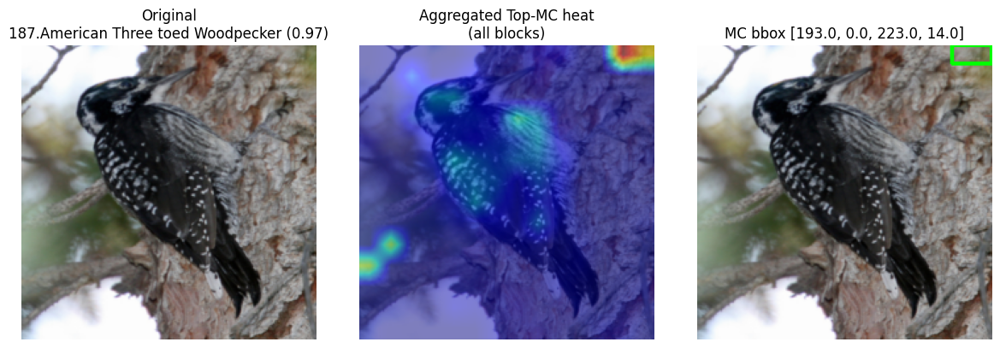


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/187.American_Three_toed_Woodpecker/American_Three_Toed_Woodpecker_0013_179833.jpg
[MC] Baseline -> 186.187.American Three toed Woodpecker (conf=0.963)
[MC] After REMOVING MC heads (per-block top-3):
     -> 186.187.American Three toed Woodpecker (conf=0.379)
     conf drop: 0.963 -> 0.379


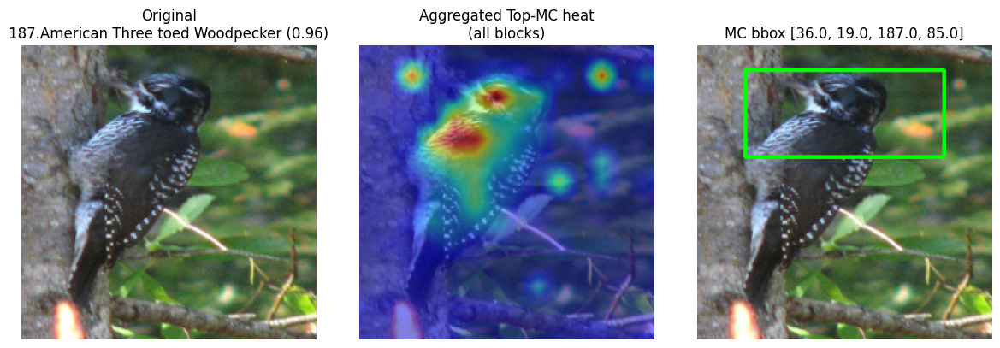


[MC] Image: /kaggle/input/cub2002011/CUB_200_2011/images/128.Seaside_Sparrow/Seaside_Sparrow_0045_120696.jpg
[MC] Baseline -> 127.128.Seaside Sparrow (conf=0.419)
[MC] After REMOVING MC heads (per-block top-3):
     -> 39.040.Olive sided Flycatcher (conf=0.546)
     conf drop: 0.419 -> 0.546


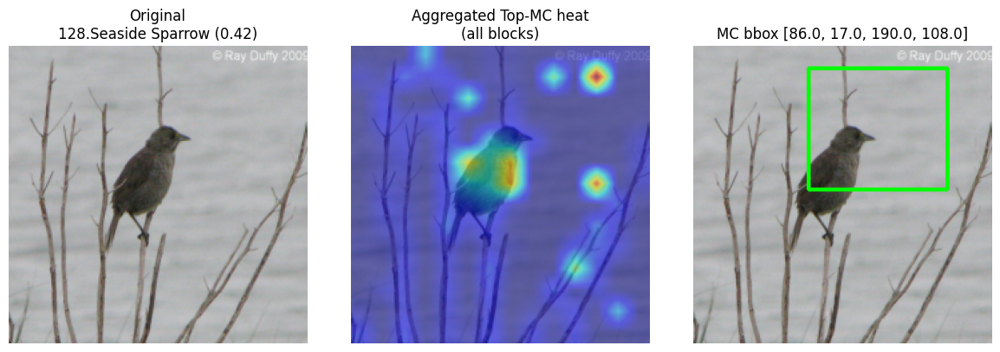


================ BATCH SUMMARY ================
Image: /kaggle/input/cub2002011/CUB_200_2011/images/182.Yellow_Warbler/Yellow_Warbler_0057_176675.jpg
  Pred(before): 182.Yellow Warbler (id=181) conf=0.912
  After removing per-block MC heads (top-3 each): 176.Prairie Warbler (id=175) conf=0.095
  conf drop: 0.912 -> 0.095
  MC heads per block:
    Block 00: [6, 2, 4]
    Block 01: [11, 5, 10]
    Block 02: [8, 6, 1]
    Block 03: [7, 11, 5]
    Block 04: [9, 7, 3]
    Block 05: [11, 9, 4]
    Block 06: [4, 6, 0]
    Block 07: [7, 10, 1]
    Block 08: [2, 5, 0]
    Block 09: [1, 4, 0]
    Block 10: [6, 1, 8]
    Block 11: [7, 6, 11]
  MC bbox: [118.0, 102.0, 142.0, 126.0]

Image: /kaggle/input/cub2002011/CUB_200_2011/images/116.Chipping_Sparrow/Chipping_Sparrow_0053_109774.jpg
  Pred(before): 116.Chipping Sparrow (id=115) conf=0.602
  After removing per-block MC heads (top-3 each): 033.Yellow billed Cuckoo (id=32) conf=0.472
  conf drop: 0.602 -> 0.472
  MC heads per block:
    Block 00

In [6]:
# CELL 3 — MC visualization on 5 random images (ALL BLOCKS)


import cv2, math, random
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib import cm
from torchvision.ops import masks_to_boxes
from pathlib import Path

vit_classifier.eval()


# Low-level attention forward (1 block)

def _attn_forward_block(attn_module, x_in, kill_heads=None):
    """
    x_in: [B,N,D] after norm1
    kill_heads: list[int] -> zero these heads' outputs before proj
    """
    B, N, C = x_in.shape
    qkv = attn_module.qkv(x_in)                           # [B,N,3*dim]
    qkv = qkv.reshape(B, N, 3, attn_module.num_heads, attn_module.head_dim)
    qkv = qkv.permute(2,0,3,1,4)                          # [3,B,H,N,hdim]
    q, k, v = qkv[0], qkv[1], qkv[2]

    attn_scores = (q @ k.transpose(-2,-1)) * attn_module.scale   # [B,H,N,N]
    attn_weights = attn_scores.softmax(dim=-1)
    attn_drop = attn_module.attn_drop(attn_weights)

    out = attn_drop @ v                                        # [B,H,N,hdim]
    if kill_heads:
        for h in kill_heads:
            if 0 <= h < out.shape[1]:
                out[:, h, :, :] = 0.0

    out = out.transpose(1,2).reshape(B, N, C)
    out = attn_module.proj(out)
    out = attn_module.proj_drop(out)
    return out, attn_weights


# Full ViT forward; optionally ablate multiple heads per block

@torch.no_grad()
def forward_with_kill_plan(model, img_batch, kill_plan=None):
    """
    kill_plan: dict {block_idx: [head_ids,...]} or None
    Returns:
      logits [1,C], attn_per_block (list of [H,N,N]), tokens_pre_norm [1,N,D]
    """
    m = model
    B = img_batch.shape[0]
    # patch embed
    x = m.patch_embed(img_batch)
    cls_tok = m.cls_token.expand(B, -1, -1)
    x = torch.cat([cls_tok, x], dim=1)
    x = x + m.pos_embed
    x = m.pos_drop(x)

    attn_per_block = []
    for b_idx, blk in enumerate(m.blocks):
        n1 = blk.norm1(x)
        kh = (kill_plan or {}).get(b_idx, None)
        out_attn, aw = _attn_forward_block(blk.attn, n1, kill_heads=kh)
        x = x + out_attn
        x = x + blk.mlp(blk.norm2(x))
        attn_per_block.append(aw[0].detach())

    tokens_pre_norm = x.clone()
    x_norm = m.norm(x)
    cls_final = x_norm[:,0]
    logits = m.head(cls_final)
    return logits, attn_per_block, tokens_pre_norm


# Heatmap + bbox (aggregate across blocks)

def heads_to_spatial_heat_multi(attn_blocks, selections_per_block, img_res=224):
    maps = []
    for b_idx, heads_map in enumerate(attn_blocks):
        Hh, N, _ = heads_map.shape
        sel = [h for h in selections_per_block.get(b_idx, []) if 0 <= h < Hh]
        if not sel: 
            continue
        cls_to_all = heads_map[:, 0, 1:]                 # [H,196]
        side = int(math.sqrt(cls_to_all.shape[1]))       # 14
        cls_maps = cls_to_all.reshape(Hh, side, side)    # [H,14,14]
        m = cls_maps[sel].mean(dim=0, keepdim=True)      # [1,14,14]
        up = F.interpolate(m.unsqueeze(1).float(), size=(img_res, img_res),
                           mode="bilinear", align_corners=False).squeeze()
        maps.append(up)
    if not maps:
        return np.zeros((img_res, img_res), dtype=np.float32)
    agg = torch.stack(maps, dim=0).mean(dim=0)
    mn, mx = agg.amin(), agg.amax()
    heat = (agg - mn) / (mx - mn + 1e-6)
    return heat.detach().cpu().numpy()

def overlay_heat_on_image(pil_img, heat, alpha_img=0.5, alpha_heat=0.5):
    base = np.array(pil_img.convert("RGB"))/255.0
    cmap_rgb = cm.jet(heat)[..., :3]
    mix = alpha_img*base + alpha_heat*cmap_rgb
    mix = np.clip(mix, 0, 1)
    return (mix*255).astype(np.uint8)

def draw_bbox_from_heat(pil_img, heat, thr=0.6):
    mask = (heat >= thr).astype(np.uint8)
    if mask.sum() == 0: 
        return np.array(pil_img), None
    box_xyxy = masks_to_boxes(torch.from_numpy(mask[None,...]))[0].tolist()
    (x1,y1,x2,y2) = [int(v) for v in box_xyxy]
    img_np = np.array(pil_img).copy()
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    cv2.rectangle(img_bgr, (x1,y1), (x2,y2), (0,255,0), 2)
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB), box_xyxy


# Run MC for ONE image (ALL blocks; top-3 per block)

@torch.no_grad()
def mc_for_single_image_allblocks(img_path, topK_each=3):
    img_batch, pil_224 = load_and_preprocess_image(img_path)
    img_batch = img_batch.to(DEVICE)

    # Baseline
    logits_base, attn_blocks_base, _ = forward_with_kill_plan(vit_classifier, img_batch, kill_plan=None)
    probs_base = logits_base.softmax(dim=1)
    conf_base, pred_idx_base = probs_base.max(dim=1)
    conf_base = conf_base.item(); pred_idx_base = pred_idx_base.item()
    pred_name_base = id2label_list[pred_idx_base] if pred_idx_base < len(id2label_list) else f"class_{pred_idx_base}"
    print("\n======================================================")
    print(f"[MC] Image: {img_path}")
    print(f"[MC] Baseline -> {pred_idx_base}.{pred_name_base} (conf={conf_base:.3f})")

    # Per-block scan (kill 1 head at a time)
    target_class = pred_idx_base
    base_logit_tgt = logits_base[0, target_class].item()
    num_blocks = len(vit_classifier.blocks)

    mc_by_block = {}
    drops_by_block = {}

    for b in range(num_blocks):
        Hh = attn_blocks_base[b].shape[0]
        drops = []
        for h in range(Hh):
            logits_kill, _, _ = forward_with_kill_plan(vit_classifier, img_batch, kill_plan={b:[h]})
            logit_h = logits_kill[0, target_class].item()
            drops.append(base_logit_tgt - logit_h)
        drops = np.array(drops)
        order = np.argsort(-drops)
        topk = min(topK_each, Hh)
        heads = order[:topk].tolist()
        mc_by_block[b] = heads
        drops_by_block[b] = drops.tolist()

    # Remove ALL selected heads across ALL blocks together
    kill_plan_all = {b: hs for b, hs in mc_by_block.items() if len(hs) > 0}
    logits_after, _, _ = forward_with_kill_plan(vit_classifier, img_batch, kill_plan=kill_plan_all)
    probs_after = logits_after.softmax(dim=1)
    conf_after, idx_after = probs_after.max(dim=1)
    conf_after = conf_after.item(); idx_after = idx_after.item()
    name_after = id2label_list[idx_after] if idx_after < len(id2label_list) else f"class_{idx_after}"

    print(f"[MC] After REMOVING MC heads (per-block top-{topK_each}):")
    print(f"     -> {idx_after}.{name_after} (conf={conf_after:.3f})")
    print(f"     conf drop: {conf_base:.3f} -> {conf_after:.3f}")

    # Heatmap + bbox from all selected (block,head)
    heat_mc = heads_to_spatial_heat_multi(attn_blocks_base, mc_by_block, img_res=224)
    overlay_img = overlay_heat_on_image(pil_224, heat_mc, 0.5, 0.5)
    boxed_img, box_xyxy = draw_bbox_from_heat(pil_224, heat_mc, thr=0.6)

    # Plots
    fig, ax = plt.subplots(1,3, figsize=(12,4))
    ax[0].imshow(pil_224); ax[0].axis("off")
    ax[0].set_title(f"Original\n{pred_name_base} ({conf_base:.2f})")
    ax[1].imshow(overlay_img); ax[1].axis("off")
    ax[1].set_title("Aggregated Top-MC heat\n(all blocks)")
    ax[2].imshow(boxed_img); ax[2].axis("off")
    ax[2].set_title(f"MC bbox {box_xyxy}" if box_xyxy else "MC bbox (none)")
    plt.tight_layout(); plt.show()

    return {
        "img_path": str(img_path),
        "pred_idx": pred_idx_base,
        "pred_name": pred_name_base,
        "pred_conf_before": conf_base,
        "pred_conf_after": conf_after,
        "pred_after_name": name_after,
        "pred_after_idx": idx_after,
        "mc_by_block": mc_by_block,         # dict: block -> [head ids]
        "drops_by_block": drops_by_block,   # dict: block -> per-head drops
        "bbox": box_xyxy,
    }


# MAIN LOOP: pick 5 random images

all_imgs = list((Path(CUB_ROOT)/"images").rglob("*.jpg"))
print(f"Total dataset images found: {len(all_imgs)}")
assert len(all_imgs) > 0, "No .jpg images found in CUB_200_2011/images"

N = 15
chosen_imgs = random.sample(all_imgs, min(N, len(all_imgs)))
print("Chosen images for MC batch:")
for p in chosen_imgs: print(" -", p)

batch_results = []
for p in chosen_imgs:
    info = mc_for_single_image_allblocks(p, topK_each=3)
    batch_results.append(info)

print("\n================ BATCH SUMMARY ================")
for r in batch_results:
    print(f"Image: {r['img_path']}")
    print(f"  Pred(before): {r['pred_name']} (id={r['pred_idx']}) conf={r['pred_conf_before']:.3f}")
    print(f"  After removing per-block MC heads (top-3 each): {r['pred_after_name']} (id={r['pred_after_idx']}) conf={r['pred_conf_after']:.3f}")
    print(f"  conf drop: {r['pred_conf_before']:.3f} -> {r['pred_conf_after']:.3f}")
    print(f"  MC heads per block:")
    for b, hs in r['mc_by_block'].items():
        print(f"    Block {b:02d}: {hs}")
    print(f"  MC bbox: {r['bbox']}")
    print()
print("===============================================")

# Result Section (For Paper)

# Table 5

In [11]:
# === LAST CELL — Table-5 style evaluation (Beginner vs Advanced) ============
# Needs defined earlier in your notebook:
# vit_classifier, load_and_preprocess_image, id2label_list, CUB_ROOT, IMG_ROOT, DEVICE

import numpy as np, torch, cv2, random
import torch.nn.functional as F
from pathlib import Path
from collections import defaultdict, Counter
from tqdm import tqdm
from PIL import Image

vit_classifier.eval()
random.seed(42); np.random.seed(42); torch.manual_seed(42)

# ----------------------------- CUB readers ----------------------------------
CUB_ROOT = Path(CUB_ROOT)
IMG_ROOT = Path(IMG_ROOT)

# images.txt  (img_id, relative_path)
img_id_to_relpath = {}
with open(CUB_ROOT / "images.txt", "r") as f:
    for line in f:
        line = line.strip()
        if not line: 
            continue
        i, rel = line.split(maxsplit=1)
        img_id_to_relpath[int(i)] = rel

# image_class_labels.txt  (img_id, class_id 1..200) -> 0-based
img_id_to_cls = {}
with open(CUB_ROOT / "image_class_labels.txt", "r") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        i, c = line.split(maxsplit=1)
        img_id_to_cls[int(i)] = int(c) - 1

# parts/parts.txt  (part_id, name with spaces allowed)
part_id_to_name = {}
with open(CUB_ROOT / "parts/parts.txt", "r") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        pid_str, pname = line.split(maxsplit=1)
        part_id_to_name[int(pid_str)] = pname.lower()

# parts/part_locs.txt  (image_id, part_id, x, y, visible)
# keep only visible=1
parts_by_img = defaultdict(list)  # iid -> [(pid,x,y), ...]
with open(CUB_ROOT / "parts/part_locs.txt", "r") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        iid, pid, x, y, vis = line.split(maxsplit=4)
        iid, pid, vis = int(iid), int(pid), int(vis)
        x, y = float(x), float(y)
        if vis == 1:
            parts_by_img[iid].append((pid, x, y))

# attributes/attributes.txt  (attr_id, name with spaces allowed)
attr_id_to_name = {}
with open(CUB_ROOT / "attributes/attributes.txt", "r") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        aid_str, aname = line.split(maxsplit=1)
        attr_id_to_name[int(aid_str)] = aname.lower()

# attributes/image_attribute_labels.txt
# (image_id, attribute_id, is_present, certainty_id, time)
attr_counts_by_class = defaultdict(lambda: Counter())
class_img_counts = Counter(img_id_to_cls.values())
with open(CUB_ROOT / "attributes/image_attribute_labels.txt", "r") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        iid, aid, present, certainty, t = line.split(maxsplit=4)
        iid, aid, present = int(iid), int(aid), int(present)
        if present == 1:
            cls = img_id_to_cls[iid]
            attr_counts_by_class[cls][aid] += 1

attr_freq_by_class = defaultdict(dict)  # cls -> {aid: freq(0..1)}
for cls, nimg in class_img_counts.items():
    for aid in attr_id_to_name.keys():
        attr_freq_by_class[cls][aid] = attr_counts_by_class[cls][aid] / max(1, nimg)

# ---------------- attribute-name -> candidate parts mapping ------------------
ATTR2PART_KEYS = {
    "head":   ["head","crown","nape","throat","cap","forehead"],
    "eye":    ["eye","eyering","eyebrow"],
    "bill":   ["bill","beak"],
    "wing":   ["wing","primary","secondary","covert","coverts"],
    "breast": ["breast","chest"],
    "belly":  ["belly","underparts","ventral"],
    "back":   ["back","mantle","scapular"],
    "tail":   ["tail","undertail","tailpattern","tailcolor"],
    "leg":    ["leg","tarsus","toe","foot"],
}

def attribute_to_part_ids(attr_name: str):
    a = attr_name.lower()
    part_ids = set()
    for pkey, kws in ATTR2PART_KEYS.items():
        if any(k in a for k in kws):
            for pid, pname in part_id_to_name.items():
                if pkey in pname:
                    part_ids.add(pid)
    return list(part_ids)

# ======================= LOCAL MC (LAST BLOCK ONLY) =========================
def run_attention_extract_local(attn_module, x_in, kill_head_idx=None):
    """
    Local copy: single attention forward with optional one-head kill.
    DOES NOT depend on any notebook-global _attn_forward_block.
    """
    B_, N_, C_ = x_in.shape
    qkv = attn_module.qkv(x_in)  # [B,N,3*dim]
    qkv = qkv.reshape(B_, N_, 3, attn_module.num_heads, attn_module.head_dim)
    qkv = qkv.permute(2, 0, 3, 1, 4)  # [3,B,H,N,hdim]
    q, k, v = qkv[0], qkv[1], qkv[2]   # [B,H,N,hdim]

    attn_scores = (q @ k.transpose(-2, -1)) * attn_module.scale
    attn_weights = attn_scores.softmax(dim=-1)
    attn_drop = attn_module.attn_drop(attn_weights)

    out = attn_drop @ v  # [B,H,N,hdim]
    if kill_head_idx is not None and 0 <= kill_head_idx < out.shape[1]:
        out[:, kill_head_idx, :, :] = 0.0

    out = out.transpose(1, 2).reshape(B_, N_, C_)  # [B,N,C]
    out = attn_module.proj(out)
    out = attn_module.proj_drop(out)
    return out, attn_weights

@torch.no_grad()
def _vit_forward_lastblock(img_batch, kill_head_idx=None, return_attn=False):
    """
    Forward ViT but manually handle ONLY last block with optional head ablation.
    Independent from forward_with_optional_kill.
    """
    m = vit_classifier
    B = img_batch.shape[0]

    # patch embed + pos
    x = m.patch_embed(img_batch)
    cls_tok = m.cls_token.expand(B, -1, -1)
    x = torch.cat([cls_tok, x], dim=1)
    x = x + m.pos_embed
    x = m.pos_drop(x)

    # all blocks except last: normal
    for blk in m.blocks[:-1]:
        x = blk(x)

    # last block custom
    blk = m.blocks[-1]
    n1 = blk.norm1(x)
    attn_out, attn_weights = run_attention_extract_local(
        blk.attn, n1, kill_head_idx=kill_head_idx
    )
    x2 = x + attn_out
    x3 = x2 + blk.mlp(blk.norm2(x2))

    tokens = x3
    x_norm = m.norm(tokens)
    cls_final = x_norm[:, 0]
    logits = m.head(cls_final)

    if return_attn:
        return logits, attn_weights[0].detach()  # [H,N,N]
    else:
        return logits, None

def heads_to_spatial_heat_last(attn_heads, head_indices, img_res=224):
    """
    attn_heads: [H,N,N] (last block)
    head_indices: list[int]
    Returns heat [img_res,img_res] in [0,1]
    """
    H, N, _ = attn_heads.shape
    cls_to_all = attn_heads[:, 0, 1:]         # [H, 196]
    side = int((cls_to_all.shape[1]) ** 0.5)  # 14 for ViT-B/16
    cls_maps = cls_to_all.reshape(H, side, side)

    valid = [h for h in head_indices if 0 <= h < H]
    if not valid:
        valid = list(range(H))
    chosen = cls_maps[valid]                 # [K,14,14]
    avg_map = chosen.mean(dim=0, keepdim=True)  # [1,14,14]

    up = F.interpolate(
        avg_map.unsqueeze(1).float(),  # [1,1,14,14]
        size=(img_res, img_res),
        mode="bilinear",
        align_corners=False
    ).squeeze()
    mn, mx = up.amin(), up.amax()
    heat = (up - mn) / (mx - mn + 1e-6)
    return heat.detach().cpu().numpy()

@torch.no_grad()
def mc_mask_from_last_block(img_batch, topk_heads=5, img_res=224,
                            thr_percent=85, dilate_ks=3, erode_ks=0):
    """
    MC explanation using ONLY last block heads (logit drop based).
    No dependency on any other helper.
    """
    # baseline (no kill) + attn map
    logits_base, attn_last = _vit_forward_lastblock(
        img_batch.to(DEVICE), kill_head_idx=None, return_attn=True
    )
    probs = logits_base.softmax(dim=1)
    pred_idx = int(probs.argmax(dim=1).item())
    base_logit_tgt = logits_base[0, pred_idx].item()

    # per-head ablation on last block
    H = attn_last.shape[0]
    drops = []
    for h in range(H):
        logits_kill, _ = _vit_forward_lastblock(
            img_batch.to(DEVICE), kill_head_idx=h, return_attn=False
        )
        logit_h = logits_kill[0, pred_idx].item()
        drops.append(base_logit_tgt - logit_h)
    drops = np.array(drops)
    order = np.argsort(-drops)
    mc_heads = order[:min(topk_heads, H)].tolist()

    # heatmap from chosen heads
    heat = heads_to_spatial_heat_last(attn_last, mc_heads, img_res=img_res)
    thr = np.percentile(heat, thr_percent)
    mask = (heat >= thr).astype(np.uint8)

    if dilate_ks > 0:
        mask = cv2.dilate(mask, np.ones((dilate_ks, dilate_ks), np.uint8), 1)
    if erode_ks > 0:
        mask = cv2.erode(mask, np.ones((erode_ks, erode_ks), np.uint8), 1)

    return mask, pred_idx

# ------------------- GT (distinct parts) for pred vs cf ---------------------
def gt_part_points_for_pair(image_id: int, cls_pred: int, cls_cf: int):
    """
    Choose 'distinct' parts via top attribute frequency differences.
    Fallback: if none map to parts, use ALL visible parts for that image.
    Returns: (points_xy, total_visible_points)
    """
    diffs = []
    for aid, aname in attr_id_to_name.items():
        dp = attr_freq_by_class[cls_pred].get(aid, 0.0)
        dc = attr_freq_by_class[cls_cf].get(aid, 0.0)
        diffs.append((abs(dp - dc), aid, aname))
    diffs.sort(reverse=True)
    top_attrs = diffs[:15]

    cand_part_ids = set()
    for _, aid, aname in top_attrs:
        cand_part_ids.update(attribute_to_part_ids(aname))

    pts_all = parts_by_img.get(image_id, [])
    if not pts_all:
        return [], 0

    if cand_part_ids:
        pts = [(x, y) for (pid, x, y) in pts_all if pid in cand_part_ids]
    else:
        # fallback: all visible parts (prevents crash; precision may inflate)
        pts = [(x, y) for (_, x, y) in pts_all]

    return pts, len(pts_all)

def img_id_to_path(iid: int) -> Path:
    return IMG_ROOT / img_id_to_relpath[iid]

# ---- precise point->mask indexing using original image size ----
def count_points_inside_mask(points_xy, mask_bin, orig_w, orig_h):
    """Map (x,y) from original image space -> mask space and count hits."""
    H, W = mask_bin.shape
    c = 0
    for (x, y) in points_xy:
        xi = int(round(x * (W / max(1.0, orig_w))))
        yi = int(round(y * (H / max(1.0, orig_h))))
        if 0 <= xi < W and 0 <= yi < H and mask_bin[yi, xi] > 0:
            c += 1
    return c

@torch.no_grad()
def probs_for_image(img_batch):
    logits = vit_classifier(img_batch.to(DEVICE))
    return logits.softmax(dim=1)[0].detach().cpu().numpy()

def second_best_class(probs: np.ndarray) -> int:
    order = np.argsort(-probs)
    return int(order[1])

# ------------------------ Eval (Beginner vs Advanced) -----------------------
# Build per-class image ids
cls_to_img_ids = defaultdict(list)
for iid in img_id_to_relpath.keys():
    cls_to_img_ids[img_id_to_cls[iid]].append(iid)

all_classes = sorted(cls_to_img_ids.keys())
SELECTED_CLASSES = random.sample(all_classes, 5)  # pick any 5 classes
IMAGES_PER_CLASS = 8                              # tune for speed

def evaluate_one(iid: int, mode: str):
    """
    mode: 'beginner' (random cf != pred), 'advanced' (top-2 cf).
    Returns: recall, precision
    """
    img_path = img_id_to_path(iid)

    # original size for accurate scaling
    with Image.open(img_path) as im:
        orig_w, orig_h = im.size

    # your preprocessing -> 224x224 batch
    img_batch, _ = load_and_preprocess_image(img_path)

    # MC explanation mask (last block)
    mask_exp, pred_idx = mc_mask_from_last_block(
        img_batch, topk_heads=3, img_res=224,
        thr_percent=85, dilate_ks=3, erode_ks=0
    )

    probs = probs_for_image(img_batch)
    if mode == "advanced":
        cf_idx = second_best_class(probs)
        if cf_idx == pred_idx:
            cf_idx = int(np.argsort(-probs)[2])
    else:
        cf_idx = pred_idx
        tries = 0
        while cf_idx == pred_idx and tries < 16:
            cf_idx = random.choice(all_classes)
            tries += 1

    # GT 'distinct' part points
    gt_pts, total_visible = gt_part_points_for_pair(iid, pred_idx, cf_idx)
    if total_visible == 0 or len(gt_pts) == 0:
        return None, None

    # Recall = GT parts inside / total GT parts (distinct)
    inside = count_points_inside_mask(gt_pts, mask_exp, orig_w, orig_h)
    recall = inside / max(1, len(gt_pts))

    # Precision = GT parts inside / all annotated parts inside
    all_pts = [(x, y) for (_, x, y) in parts_by_img.get(iid, [])]
    inside_all = count_points_inside_mask(all_pts, mask_exp, orig_w, orig_h)
    precision = inside / max(1, inside_all)

    return recall, precision

# Run loop
results = {"beginner":{"recall":[], "prec":[]},
           "advanced":{"recall":[], "prec":[]}}

print("Selected classes:", [f"{c}:{id2label_list[c]}" for c in SELECTED_CLASSES])

for c in SELECTED_CLASSES:
    ids = cls_to_img_ids[c][:]
    random.shuffle(ids)
    for iid in tqdm(ids[:IMAGES_PER_CLASS], desc=f"class {c}"):
        rb, pb = evaluate_one(iid, "beginner")
        ra, pa = evaluate_one(iid, "advanced")
        if rb is not None:
            results["beginner"]["recall"].append(rb)
            results["beginner"]["prec"].append(pb)
        if ra is not None:
            results["advanced"]["recall"].append(ra)
            results["advanced"]["prec"].append(pa)

def mean(x): 
    return float(np.mean(x)) if len(x) else float("nan")

B_rec = mean(results["beginner"]["recall"])
B_pre = mean(results["beginner"]["prec"])
A_rec = mean(results["advanced"]["recall"])
A_pre = mean(results["advanced"]["prec"])

# Pretty print
print("\n=== Table-5 Style (Your Model, MC last block) ===")
print(f"Beginner -> Recall = {B_rec:.3f} | Prec. = {B_pre:.2f}")
print(f"Advanced -> Recall = {A_rec:.3f} | Prec. = {A_pre:.2f}")
print(f"Samples  -> Beginner n={len(results['beginner']['recall'])} | Advanced n={len(results['advanced']['recall'])}")

# Save per-image CSV
import pandas as pd
rows = []
for mode in ("beginner","advanced"):
    for r,p in zip(results[mode]["recall"], results[mode]["prec"]):
        rows.append({"mode":mode, "recall":r, "precision":p})
df = pd.DataFrame(rows)
out_csv = Path("/kaggle/working/table5_your_model_mc_lastblock.csv")
df.to_csv(out_csv, index=False)
print(f"Saved -> {out_csv}")


Selected classes: ['163:164.Cerulean Warbler', '28:029.American Crow', '6:007.Parakeet Auklet', '189:190.Red cockaded Woodpecker', '70:071.Long tailed Jaeger']


class 70: 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]


=== Table-5 Style (Your Model, MC last block) ===
Beginner -> Recall = 0.721 | Prec. = 0.57
Advanced -> Recall = 0.663 | Prec. = 0.59
Samples  -> Beginner n=40 | Advanced n=40
Saved -> /kaggle/working/table5_your_model_mc_lastblock.csv


# Table 4

In [31]:
# === CELL — Table 4 experiment (All blocks, fixed λ=2, WITH vs W/O logits loss) ===
# Requires from CELL 1: vit_classifier, id2label_list, transform_img, IMG_ROOT

import os, math, time, json, glob, random
from pathlib import Path
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from sklearn.model_selection import train_test_split

# -------- sanity on prerequisites --------
assert 'vit_classifier' in globals() and 'id2label_list' in globals() and 'transform_img' in globals(), "Run CELL 1 first."
assert 'IMG_ROOT' in globals(), "IMG_ROOT must point to .../CUB_200_2011/images"

# -------- user inputs (you can tweak) --------
CLASS_ID    = 120
TRAIN_SPLIT = 0.6
EPOCHS      = 5
BATCH_SIZE  = 8
LR          = 1e-3
THRESH      = 0.5              # gate > THRESH => counted as active head
LAM         = 2                # fixed λ for Table 4
ALPHA_LOGITS= 0.1              # weight for logits loss term (try 0.05–0.2)

DEVICE = next(vit_classifier.parameters()).device
vit_classifier.eval()

# -------- helpers: class dir resolve, dataset --------
def resolve_class_dir(img_root: Path, labels: list[str], cid: int):
    raw = labels[cid]
    cand = [raw, raw.replace(" ", "_"), raw.replace("_", " ")]
    for name in cand:
        p = img_root / name
        if p.exists():
            return name, p
    folders = sorted([p.name for p in img_root.iterdir() if p.is_dir()])
    assert 0 <= cid < len(folders), f"cid out of range: {cid}"
    name = folders[cid]
    return name, img_root / name

target_class_name, class_dir = resolve_class_dir(IMG_ROOT, id2label_list, CLASS_ID)
IMG_EXTS = {".jpg", ".jpeg", ".png"}
all_imgs = sorted([p for p in class_dir.rglob("*") if p.suffix.lower() in IMG_EXTS])
assert len(all_imgs) > 0, f"No images for class {CLASS_ID} ({target_class_name})"

train_paths, test_paths = train_test_split(all_imgs, train_size=TRAIN_SPLIT, random_state=42, shuffle=True)
print(f"Target class: [{CLASS_ID}] {target_class_name}")
print(f"Train images: {len(train_paths)} | Test images: {len(test_paths)}")

class SingleClassCUB(torch.utils.data.Dataset):
    def __init__(self, paths, transform):
        self.paths = paths; self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        p = self.paths[idx]
        with Image.open(p).convert("RGB") as im: img = im.copy()
        x = self.transform(img)
        y = torch.tensor(CLASS_ID, dtype=torch.long)
        return x, y

train_loader = torch.utils.data.DataLoader(SingleClassCUB(train_paths, transform_img),
                                           batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
test_loader  = torch.utils.data.DataLoader(SingleClassCUB(test_paths, transform_img),
                                           batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# -------- CFE (MC) gater on ALL ViT blocks --------
NUM_BLOCKS       = len(vit_classifier.blocks)
HEADS_PER_BLOCK  = vit_classifier.blocks[0].attn.num_heads
TOTAL_HEADS      = NUM_BLOCKS * HEADS_PER_BLOCK

class AllBlocksGater(nn.Module):
    """
    Predicts per-block per-head gates and applies them inside every block's attention.
    Returns:
      logits: [B, C]
      gates:  [B, NUM_BLOCKS, HEADS_PER_BLOCK] in (0,1)
    """
    def __init__(self, vit_model):
        super().__init__()
        self.vit = vit_model
        D = self.vit.blocks[0].norm1.normalized_shape[0]
        self.gater = nn.Sequential(
            nn.Linear(D, 256), nn.ReLU(inplace=True),
            nn.Linear(256, HEADS_PER_BLOCK),
        )
        for p in self.vit.parameters(): p.requires_grad = False

    def _attn_with_gates(self, blk, n1, gates_bh):
        B, N, _ = n1.shape
        attn = blk.attn
        qkv = attn.qkv(n1)
        qkv = qkv.reshape(B, N, 3, attn.num_heads, attn.head_dim).permute(2,0,3,1,4)
        q, k, v = qkv[0], qkv[1], qkv[2]                      # [B,H,N,Dh]
        attn_scores  = (q @ k.transpose(-2,-1)) * attn.scale
        attn_weights = attn_scores.softmax(dim=-1)
        out = attn.attn_drop(attn_weights) @ v                # [B,H,N,Dh]
        out = out * gates_bh.view(B, attn.num_heads, 1, 1)    # gate each head stream
        out = out.transpose(1,2).reshape(B, N, attn.num_heads * attn.head_dim)
        out = attn.proj(out); out = attn.proj_drop(out)
        return out

    def forward(self, img_batch):
        m = self.vit
        B = img_batch.shape[0]
        x = m.patch_embed(img_batch)
        cls_tok = m.cls_token.expand(B, -1, -1)
        x = torch.cat([cls_tok, x], dim=1)
        x = x + m.pos_embed
        x = m.pos_drop(x)

        gates_all = []
        for blk in m.blocks:
            n1 = blk.norm1(x)
            pooled = n1.mean(dim=1)
            g_raw  = self.gater(pooled)
            gates  = torch.sigmoid(g_raw)                      # [B,H]
            out = self._attn_with_gates(blk, n1, gates)
            x2 = x + out
            x  = x2 + blk.mlp(blk.norm2(x2))
            gates_all.append(gates)

        x_norm = m.norm(x)
        cls_final = x_norm[:, 0]
        logits = m.head(cls_final)
        gates_tensor = torch.stack(gates_all, dim=1)           # [B, NUM_BLOCKS, H]
        return logits, gates_tensor

# -------- logits loss (reported even if not used in training) --------
def logits_loss_term(logits: torch.Tensor):
    # negative mean squared logits: pushes confidence up when included
    return -(logits.pow(2).mean())

@torch.no_grad()
def eval_with_metrics(model_g, loader):
    model_g.eval()
    total = correct = 0
    ce_sum = l1_sum = logit_sum = heads_sum = 0.0
    n_batches = 0
    for xb, _ in loader:
        xb = xb.to(DEVICE, non_blocking=True)
        logits, gates = model_g(xb)
        target = torch.full((xb.size(0),), CLASS_ID, dtype=torch.long, device=xb.device)
        ce  = F.cross_entropy(logits, target, reduction='mean')
        l1  = gates.abs().mean()
        lg  = logits_loss_term(logits)
        pred = logits.argmax(1)
        correct += (pred == target).sum().item()
        total   += xb.size(0)
        ce_sum  += ce.item(); l1_sum += l1.item(); logit_sum += lg.item()
        heads_sum += (gates > THRESH).float().sum(dim=(1,2)).mean().item()
        n_batches += 1
    acc = 100.0 * correct / max(total,1)
    fac = 1.0 / max(n_batches,1)
    return acc, ce_sum*fac, l1_sum*fac, logit_sum*fac, heads_sum*fac

def run_one_condition(use_logits_loss: bool):
    tag = "With logits loss" if use_logits_loss else "W/o logits loss"
    model_g = AllBlocksGater(vit_classifier).to(DEVICE)
    opt = torch.optim.AdamW(model_g.gater.parameters(), lr=LR, weight_decay=1e-4)

    for ep in range(1, EPOCHS+1):
        model_g.train()
        ce_run = l1_run = lg_run = 0.0
        n_batches = correct = total = 0
        for xb, _ in train_loader:
            xb = xb.to(DEVICE, non_blocking=True)
            logits, gates = model_g(xb)
            target = torch.full((xb.size(0),), CLASS_ID, dtype=torch.long, device=xb.device)
            ce = F.cross_entropy(logits, target, reduction='mean')
            l1 = gates.abs().mean()
            loss = ce + LAM * l1
            if use_logits_loss:
                lg = logits_loss_term(logits)
                loss = loss + ALPHA_LOGITS * lg
                lg_run += lg.item()
            opt.zero_grad(set_to_none=True); loss.backward(); opt.step()
            ce_run += ce.item(); l1_run += l1.item(); n_batches += 1
            pred = logits.argmax(1); correct += (pred == target).sum().item(); total += xb.size(0)
        tr_acc = 100.0 * correct / max(total,1)
        tr_ce  = ce_run / max(n_batches,1); tr_l1 = l1_run / max(n_batches,1)
        msg = f"[{tag}] Epoch {ep}/{EPOCHS} | train acc {tr_acc:.2f}% | CE {tr_ce:.3f} | L1 {tr_l1:.3f}"
        if use_logits_loss: msg += f" | Logits {lg_run/max(n_batches,1):.3f}"
        print(msg)

    tr = eval_with_metrics(model_g, train_loader)
    te = eval_with_metrics(model_g, test_loader)
    return {"tag": tag, "train": tr, "test": te}

print("\n" + "="*80)
print(f"Table-4 run (CLASS={CLASS_ID} {target_class_name}) | λ={LAM} | THRESH={THRESH} | "
      f"TOTAL_HEADS={TOTAL_HEADS} (= {NUM_BLOCKS:=} blocks × {HEADS_PER_BLOCK:=} heads)")
print("="*80)

res_with = run_one_condition(True)
res_wo   = run_one_condition(False)

# -------- Pretty print exactly like Table 4 --------
def row(tag, tup):
    acc, ce, l1, lg, heads = tup
    print(f"{tag:<18} {acc:>7.1f}% {ce:>9.3f} {l1:>9.3f} {lg:>12.3f} {heads:>8.1f}")

print("\nTable 4 — MC CFE (All blocks) with and without logits loss (λ=2)")
print(f"(TOTAL_HEADS={TOTAL_HEADS} = {NUM_BLOCKS} blocks × {HEADS_PER_BLOCK} heads)")
print("-"*72)
print("VGG-16 CFE".ljust(18), "Accuracy".rjust(9), "CE Loss".rjust(9), "L1 loss".rjust(9), "Logits loss".rjust(12), "Heads".rjust(8))
print("\nTraining"); row(res_with["tag"], res_with["train"]); row(res_wo["tag"], res_wo["train"])
print("\nTesting");  row(res_with["tag"], res_with["test"]);  row(res_wo["tag"], res_wo["test"])
print("-"*72)
print("Notes: ‘Heads’ = GLOBAL MC heads per image (sum over all blocks & heads where gate>THRESH), batch-averaged.")
print( "Adjust ALPHA_LOGITS (0.05–0.2) if the scale looks off.")

Target class: [120] 121.Grasshopper_Sparrow
Train images: 36 | Test images: 24

Table-4 run (CLASS=120 121.Grasshopper_Sparrow) | λ=2 | THRESH=0.5 | TOTAL_HEADS=144 (= 12 blocks × 12 heads)
[With logits loss] Epoch 1/5 | train acc 66.67% | CE 2.074 | L1 0.524 | Logits -2.644
[With logits loss] Epoch 2/5 | train acc 80.56% | CE 1.017 | L1 0.558 | Logits -2.733
[With logits loss] Epoch 3/5 | train acc 83.33% | CE 0.691 | L1 0.552 | Logits -2.947
[With logits loss] Epoch 4/5 | train acc 91.67% | CE 0.580 | L1 0.529 | Logits -3.027
[With logits loss] Epoch 5/5 | train acc 91.67% | CE 0.493 | L1 0.521 | Logits -3.089
[W/o logits loss] Epoch 1/5 | train acc 66.67% | CE 1.636 | L1 0.518
[W/o logits loss] Epoch 2/5 | train acc 80.56% | CE 0.922 | L1 0.554
[W/o logits loss] Epoch 3/5 | train acc 83.33% | CE 0.614 | L1 0.550
[W/o logits loss] Epoch 4/5 | train acc 86.11% | CE 0.484 | L1 0.525
[W/o logits loss] Epoch 5/5 | train acc 91.67% | CE 0.507 | L1 0.509

Table 4 — MC CFE (All blocks) with

# Table 3

In [28]:
# === CELL — Table 3 style experiment (MC-CFE on single class, λ ∈ {1,2,4}) — ALL BLOCKS ===
# Requirements: CELL 1 run (vit_classifier, id2label_list, transform_img, IMG_ROOT defined)

import os, random, math, json, glob, time
from pathlib import Path
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from sklearn.model_selection import train_test_split

assert 'vit_classifier' in globals() and 'id2label_list' in globals() and 'transform_img' in globals(), "Run CELL 1 first."
assert 'IMG_ROOT' in globals(), "IMG_ROOT must point to .../CUB_200_2011/images"

# ---------- User input ----------
CLASS_ID   = 191
TRAIN_SPLIT= 0.6
EPOCHS     = 5
BATCH_SIZE = 8
LR         = 1e-3
LAMBDAS    = [1, 2, 3]
THRESH     = 0.5

DEVICE = next(vit_classifier.parameters()).device
vit_classifier.eval()

# ---------- Helper: resolve class folder name robustly ----------
def resolve_class_dir(img_root: Path, labels: list[str], cid: int):
    raw = labels[cid]
    cand = [raw, raw.replace(" ", "_"), raw.replace("_", " ")]
    for name in cand:
        p = img_root / name
        if p.exists():
            return name, p
    folders = sorted([p.name for p in img_root.iterdir() if p.is_dir()])
    assert 0 <= cid < len(folders), f"cid out of range: {cid}"
    name = folders[cid]
    return name, img_root / name

# ---------- Collect single-class images ----------
target_class_name, class_dir = resolve_class_dir(IMG_ROOT, id2label_list, CLASS_ID)
assert class_dir.exists(), f"Class folder not found: {class_dir}"

IMG_EXTS = {".jpg", ".jpeg", ".png"}
all_imgs = sorted([p for p in class_dir.rglob("*") if p.suffix.lower() in IMG_EXTS])
assert len(all_imgs) > 0, f"No images found for class {CLASS_ID} ({target_class_name})"

train_paths, test_paths = train_test_split(all_imgs, train_size=TRAIN_SPLIT, random_state=42, shuffle=True)

print(f"Target class: [{CLASS_ID}] {target_class_name}")
print(f"Train images: {len(train_paths)} | Test images: {len(test_paths)}")

# ---------- Simple Dataset (single class) ----------
class SingleClassCUB(torch.utils.data.Dataset):
    def __init__(self, paths, transform):
        self.paths = paths
        self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        p = self.paths[idx]
        with Image.open(p).convert("RGB") as im:
            img = im.copy()
        x = self.transform(img)
        y = torch.tensor(CLASS_ID, dtype=torch.long)
        return x, y

train_ds = SingleClassCUB(train_paths, transform_img)
test_ds  = SingleClassCUB(test_paths,  transform_img)

train_loader = torch.utils.data.DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
test_loader  = torch.utils.data.DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ---------- CFE (MC) Gater on ALL blocks ----------
NUM_BLOCKS = len(vit_classifier.blocks)
HEADS_PER_BLOCK = vit_classifier.blocks[0].attn.num_heads
TOTAL_HEADS = NUM_BLOCKS * HEADS_PER_BLOCK

class AllBlocksGater(nn.Module):
    """
    Predicts per-block per-head gates and applies them inside every block's attention.
    Returns:
      logits: [B, C]
      gates:  [B, NUM_BLOCKS, HEADS_PER_BLOCK] in (0,1)
    """
    def __init__(self, vit_model):
        super().__init__()
        self.vit = vit_model
        D = self.vit.blocks[0].norm1.normalized_shape[0]
        # Shared tiny MLP used for each block (keeps params small & stable)
        self.gater = nn.Sequential(
            nn.Linear(D, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, HEADS_PER_BLOCK),
        )
        # Freeze ViT backbone; train only gates
        for p in self.vit.parameters():
            p.requires_grad = False

    def _attn_with_gates(self, blk, n1, gates_bh):
        # n1: [B,N,D], gates_bh: [B,H] in (0,1)
        B, N, _ = n1.shape
        attn = blk.attn
        qkv = attn.qkv(n1)
        qkv = qkv.reshape(B, N, 3, attn.num_heads, attn.head_dim).permute(2,0,3,1,4)
        q, k, v = qkv[0], qkv[1], qkv[2]                  # [B,H,N,Dh]
        attn_scores  = (q @ k.transpose(-2,-1)) * attn.scale
        attn_weights = attn_scores.softmax(dim=-1)
        out = attn.attn_drop(attn_weights) @ v            # [B,H,N,Dh]
        out = out * gates_bh.view(B, attn.num_heads, 1, 1)
        out = out.transpose(1,2).reshape(B, N, attn.num_heads * attn.head_dim)
        out = attn.proj(out)
        out = attn.proj_drop(out)
        return out

    def forward(self, img_batch):
        m = self.vit
        B = img_batch.shape[0]
        # patch embedding
        x = m.patch_embed(img_batch)
        cls_tok = m.cls_token.expand(B, -1, -1)
        x = torch.cat([cls_tok, x], dim=1)
        x = x + m.pos_embed
        x = m.pos_drop(x)

        gates_all = []

        # iterate ALL blocks, predict gates, apply in attention path
        for blk_idx, blk in enumerate(m.blocks):
            n1 = blk.norm1(x)                     # [B,N,D]
            pooled = n1.mean(dim=1)               # [B,D]
            g_raw  = self.gater(pooled)           # [B,H]
            gates  = torch.sigmoid(g_raw)         # [B,H]
            out = self._attn_with_gates(blk, n1, gates)
            x2 = x + out
            x  = x2 + blk.mlp(blk.norm2(x2))
            gates_all.append(gates)

        # classifier head
        x_norm = m.norm(x)
        cls_final = x_norm[:, 0]
        logits = m.head(cls_final)

        gates_tensor = torch.stack(gates_all, dim=1)  # [B, NUM_BLOCKS, H]
        return logits, gates_tensor

# ---------- Train/Eval ----------
@torch.no_grad()
def evaluate_loop(model_g, data_loader, lam):
    model_g.eval()
    total = correct = 0
    ce_sum = l1_sum = 0.0
    act_total_heads = 0.0
    n_batches = 0

    for xb, _ in data_loader:
        xb = xb.to(DEVICE, non_blocking=True)
        logits, gates = model_g(xb)                 # gates: [B, Bk, H]
        target = torch.full((xb.size(0),), CLASS_ID, dtype=torch.long, device=xb.device)
        ce = F.cross_entropy(logits, target, reduction='mean')
        l1 = gates.abs().mean()

        pred = logits.argmax(1)
        correct += (pred == target).sum().item()
        total   += xb.size(0)
        ce_sum  += ce.item()
        l1_sum  += l1.item()

        # Global MC heads count (sum over all blocks & heads, per image), then batch-mean
        act = (gates > THRESH).float().sum(dim=(1,2))  # [B]
        act_total_heads += act.mean().item()
        n_batches += 1

    acc = 100.0 * correct / max(total, 1)
    return acc, ce_sum/max(n_batches,1), l1_sum/max(n_batches,1), act_total_heads/max(n_batches,1)

def train_one_lambda(lam):
    model_g = AllBlocksGater(vit_classifier).to(DEVICE)
    opt = torch.optim.AdamW(model_g.gater.parameters(), lr=LR, weight_decay=1e-4)

    for ep in range(1, EPOCHS+1):
        model_g.train()
        ce_running = l1_running = 0.0
        n_batches = correct = total = 0
        for xb, _ in train_loader:
            xb = xb.to(DEVICE, non_blocking=True)
            logits, gates = model_g(xb)             # gates: [B, Bk, H]
            target = torch.full((xb.size(0),), CLASS_ID, dtype=torch.long, device=xb.device)

            ce = F.cross_entropy(logits, target, reduction='mean')
            l1 = gates.abs().mean()
            loss = ce + lam * l1

            opt.zero_grad(set_to_none=True)
            loss.backward()
            opt.step()

            ce_running += ce.item()
            l1_running += l1.item()
            n_batches  += 1
            pred = logits.argmax(1)
            correct += (pred == target).sum().item()
            total   += xb.size(0)

        tr_acc = 100.0 * correct / max(total,1)
        tr_ce  = ce_running / max(n_batches,1)
        tr_l1  = l1_running / max(n_batches,1)
        print(f"[λ={lam}] Epoch {ep}/{EPOCHS} | train acc {tr_acc:.2f}% | CE {tr_ce:.3f} | L1 {tr_l1:.3f}")

    train_acc, train_ce, train_l1, train_heads = evaluate_loop(model_g, train_loader, lam)
    test_acc,  test_ce,  test_l1,  test_heads  = evaluate_loop(model_g, test_loader, lam)
    return {
        "lambda": lam,
        "train_acc": train_acc, "train_ce": train_ce, "train_l1": train_l1, "train_heads": train_heads,
        "test_acc":  test_acc,  "test_ce":  test_ce,  "test_l1":  test_l1,  "test_heads":  test_heads,
        "TOTAL_HEADS": TOTAL_HEADS
    }

# ---------- Run all lambdas & print table ----------
rows = []
for lam in LAMBDAS:
    print("\n" + "="*70)
    print(f"Training MC-CFE gater for class [{CLASS_ID}] {target_class_name} with λ={lam}")
    print("="*70)
    rows.append(train_one_lambda(lam))

print("\n" + "-"*70)
print(f"Results (CLASS={CLASS_ID} {target_class_name})  EPOCHS={EPOCHS}  THRESH={THRESH}  "
      f"TOTAL_HEADS={TOTAL_HEADS} (= {NUM_BLOCKS} blocks × {HEADS_PER_BLOCK} heads)")
print("-"*70)
print(f"{'λ':>2} | {'Train Acc%':>10} | {'CE':>6} | {'L1':>6} | {'Heads†':>9} || "
      f"{'Test Acc%':>9} | {'CE':>6} | {'L1':>6} | {'Heads†':>9}")
print("-"*70)
for r in rows:
    print(f"{r['lambda']:>2} | {r['train_acc']:10.1f} | {r['train_ce']:6.3f} | {r['train_l1']:6.3f} | {r['train_heads']:9.1f} || "
          f"{r['test_acc']:9.1f} | {r['test_ce']:6.3f} | {r['test_l1']:6.3f} | {r['test_heads']:9.1f}")
print("-"*70)
print("†‘Heads’ = GLOBAL MC heads per image (sum over all blocks & heads where gate>THRESH), batch-averaged.")

Target class: [191] 192.Downy_Woodpecker
Train images: 36 | Test images: 24

Training MC-CFE gater for class [191] 192.Downy_Woodpecker with λ=1
[λ=1] Epoch 1/5 | train acc 77.78% | CE 0.844 | L1 0.525
[λ=1] Epoch 2/5 | train acc 91.67% | CE 0.269 | L1 0.537
[λ=1] Epoch 3/5 | train acc 91.67% | CE 0.174 | L1 0.524
[λ=1] Epoch 4/5 | train acc 97.22% | CE 0.132 | L1 0.504
[λ=1] Epoch 5/5 | train acc 97.22% | CE 0.120 | L1 0.471

Training MC-CFE gater for class [191] 192.Downy_Woodpecker with λ=2
[λ=2] Epoch 1/5 | train acc 80.56% | CE 0.755 | L1 0.518
[λ=2] Epoch 2/5 | train acc 91.67% | CE 0.295 | L1 0.534
[λ=2] Epoch 3/5 | train acc 94.44% | CE 0.188 | L1 0.514
[λ=2] Epoch 4/5 | train acc 97.22% | CE 0.209 | L1 0.467
[λ=2] Epoch 5/5 | train acc 97.22% | CE 0.160 | L1 0.438

Training MC-CFE gater for class [191] 192.Downy_Woodpecker with λ=3
[λ=3] Epoch 1/5 | train acc 83.33% | CE 0.649 | L1 0.507
[λ=3] Epoch 2/5 | train acc 91.67% | CE 0.301 | L1 0.506
[λ=3] Epoch 3/5 | train acc 94.44

# Table 2

In [8]:
# === CELL — Table 2 (Selected-5 only; COMPACT PRINT) ==========================
# Computes Orig / Rand-off / MC-off ONLY on user-picked 5 classes
# and prints a compact Table-2 style summary.

import os, random, numpy as np, torch
from pathlib import Path
from collections import OrderedDict, Counter
from tabulate import tabulate
from tqdm import tqdm

vit_classifier.eval()
DEVICE = next(vit_classifier.parameters()).device
NUM_BLOCKS = len(vit_classifier.blocks)
HEADS_PER_BLOCK = vit_classifier.blocks[0].attn.num_heads

# ---------- helpers presence (define if missing) ----------
if 'logits_for_image' not in globals():
    @torch.no_grad()
    def logits_for_image(model, img_batch, kill_map=None):
        m = model
        B = img_batch.shape[0]
        x = m.patch_embed(img_batch)
        cls_tok = m.cls_token.expand(B, -1, -1)
        x = torch.cat([cls_tok, x], dim=1)
        x = x + m.pos_embed
        x = m.pos_drop(x)
        for b_idx, blk in enumerate(m.blocks):
            n1 = blk.norm1(x)
            B_, N_, C_ = n1.shape
            qkv = blk.attn.qkv(n1)
            qkv = qkv.reshape(B_, N_, 3, blk.attn.num_heads, blk.attn.head_dim).permute(2,0,3,1,4)
            q, k, v = qkv[0], qkv[1], qkv[2]
            attn_scores  = (q @ k.transpose(-2,-1)) * blk.attn.scale
            attn_weights = attn_scores.softmax(dim=-1)
            attn_drop    = blk.attn.attn_drop(attn_weights)
            out = attn_drop @ v
            if kill_map is not None and b_idx in kill_map and len(kill_map[b_idx]) > 0:
                for h in kill_map[b_idx]:
                    if 0 <= h < out.shape[1]:
                        out[:, h, :, :] = 0.0
            out = out.transpose(1,2).reshape(B_, N_, C_)
            out = blk.attn.proj(out)
            out = blk.attn.proj_drop(out)
            x = x + out
            x = x + blk.mlp(blk.norm2(x))
        x = m.norm(x)
        return m.head(x[:,0])

if 'predict_top1' not in globals():
    @torch.no_grad()
    def predict_top1(model, img_batch, kill_map=None):
        logits = logits_for_image(model, img_batch, kill_map=kill_map)
        probs  = logits.softmax(1)
        conf, idx = probs.max(1)
        return idx.item(), float(conf.item())

if 'per_image_mc_heads' not in globals():
    @torch.no_grad()
    def per_image_mc_heads(model, img_batch, topK_each=3):
        logits0 = logits_for_image(model, img_batch, kill_map=None)
        tgt     = int(logits0.softmax(1).argmax(1).item())
        base_t  = float(logits0[0, tgt].item())
        sel, drop_scores = {}, {}
        for b in range(NUM_BLOCKS):
            drops = []
            for h in range(HEADS_PER_BLOCK):
                km = {b: {h}}
                logit_k = logits_for_image(model, img_batch, kill_map=km)[0, tgt].item()
                drops.append(base_t - logit_k)
            order = np.argsort(-np.array(drops))
            sel[b] = order[:min(topK_each, HEADS_PER_BLOCK)].tolist()
            drop_scores[b] = drops
        return sel, drop_scores

# ---------- robust class-dir listing (handles spaces/underscores) ----------
IMG_EXTS = {".jpg",".jpeg",".png",".bmp",".tif",".tiff",".webp",".JPG",".JPEG",".PNG",".BMP",".TIF",".TIFF",".WEBP"}

def _norm(s): return ''.join(ch.lower() for ch in s if ch.isalnum())

def resolve_class_dir(img_root: Path, class_name: str):
    cand = [class_name,
            class_name.strip().replace(" ", "_"),
            class_name.strip().replace("_", " "),
            class_name.strip()]
    for nm in cand:
        p = img_root / nm
        if p.is_dir(): return p
    cn = _norm(class_name)
    for d in img_root.iterdir():
        if d.is_dir() and _norm(d.name) == cn: return d
    for d in img_root.iterdir():
        if d.is_dir():
            dn = _norm(d.name)
            if cn in dn or dn in cn: return d
    return None

def list_class_images(img_root: Path, class_name: str):
    d = resolve_class_dir(img_root, class_name)
    if d is None: return []
    return sorted([p for p in d.rglob("*") if p.suffix in IMG_EXTS])

def flatten_pairs(sel_map):  return [(b,h) for b,hs in sel_map.items() for h in hs]

def aggregate_global_mc(head_lists, min_freq_frac=0.50, top_cap=44):
    flat = [p for lst in head_lists for p in lst]
    if not flat: return []
    cnt = Counter(flat); nimg = len(head_lists)
    kept = [pair for pair,c in cnt.items() if (c/nimg) >= min_freq_frac]
    if not kept: kept = [p for p,_ in cnt.most_common(top_cap)]
    if len(kept) > top_cap: kept = [p for p,_ in cnt.most_common(top_cap)]
    return sorted(set(kept), key=lambda x: (x[0], x[1]))

def random_heads_same_count(count, exclude=None, seed=42):
    rng = random.Random(seed)
    universe = [(b,h) for b in range(NUM_BLOCKS) for h in range(HEADS_PER_BLOCK)]
    if exclude: universe = [p for p in universe if p not in set(exclude)]
    rng.shuffle(universe); return universe[:count]

@torch.no_grad()
def eval_metrics(model, img_paths, y_true_ids, kill_map=None):
    TP, FN, correct = {}, {}, 0
    for p, y in tqdm(list(zip(img_paths, y_true_ids)), total=len(img_paths), leave=False):
        img_b, _ = load_and_preprocess_image(p)
        pred, _ = predict_top1(model, img_b.to(DEVICE), kill_map=kill_map)
        if pred == y:
            correct += 1; TP[y] = TP.get(y, 0) + 1
        else:
            FN[y] = FN.get(y, 0) + 1
    acc = correct / max(1, len(img_paths))
    return acc, TP, FN

def compute_recall(tp, fn):
    d = tp + fn
    return 100.0 * (tp/d) if d > 0 else 0.0

# ---------- USER picks 5 IDs (EDIT THIS) ----------
USER_CLASS_IDS = [181, 6, 17, 35, 9]     # <-- apni 5 class IDs

# ---------- Build index (all), then subset to selected-5 ----------
all_class_names = list(id2label_list)
per_class_paths = {}
for cid, cname in enumerate(all_class_names):
    paths = list_class_images(IMG_ROOT, cname)
    if paths: per_class_paths[cid] = paths

# sanitize + ensure 5 classes
USER_CLASS_IDS = list(dict.fromkeys([cid for cid in USER_CLASS_IDS if cid in per_class_paths]))[:5]
assert len(USER_CLASS_IDS) == 5, f"Please provide 5 valid class IDs with images, got {USER_CLASS_IDS}"

print("Selected classes (by ID) and image counts:")
for cid in USER_CLASS_IDS:
    print(f"  - {cid:4d} | {all_class_names[cid]} : {len(per_class_paths[cid])} images")

# --- Selected-only combined set (for ALL evaluations) ---
sel_img_paths, sel_img_labels = [], []
for cid in USER_CLASS_IDS:
    sel_img_paths.extend(per_class_paths[cid])
    sel_img_labels.extend([cid]*len(per_class_paths[cid]))
print(f"\nSelected-only set: {len(sel_img_paths)} images across {len(USER_CLASS_IDS)} classes.")

# ---------- GLOBAL MC (per selected class) ----------
per_class_global_MC = {}
for cid in USER_CLASS_IDS:
    image_sets = []
    for p in tqdm(per_class_paths[cid], desc=f"MC scan {all_class_names[cid]}", leave=False):
        img_b, _ = load_and_preprocess_image(p)
        sel_map, _ = per_image_mc_heads(vit_classifier, img_b.to(DEVICE), topK_each=3)
        image_sets.append(flatten_pairs(sel_map))
    per_class_global_MC[cid] = aggregate_global_mc(image_sets, min_freq_frac=0.50, top_cap=44)

# ---------- Evaluate ON SELECTED SUBSET ONLY ----------
orig_acc, orig_TP, orig_FN = eval_metrics(vit_classifier, sel_img_paths, sel_img_labels, kill_map=None)
orig_acc_pct = orig_acc * 100.0

def short_class(cid, cname):
    # "002.Laysan_Albatross" -> "002.Laysan Albatross"
    if "." in cname:
        _, rest = cname.split(".", 1)
    else:
        rest = cname
    rest = rest.replace("_", " ")
    return f"{cid:03d}.{rest}"

rows = []
for cid in USER_CLASS_IDS:
    cname = short_class(cid, all_class_names[cid])
    mc_pairs = per_class_global_MC[cid]

    # per-class recalls (orig)
    rec_orig = compute_recall(orig_TP.get(cid,0), orig_FN.get(cid,0))

    # MC-off
    kill_map_mc = {}
    for (b,h) in mc_pairs:
        kill_map_mc.setdefault(b, set()).add(h)

    # Rand-off (same count)
    rand_pairs = random_heads_same_count(len(mc_pairs), exclude=mc_pairs, seed=cid+123)
    kill_map_rand = {}
    for (b,h) in rand_pairs:
        kill_map_rand.setdefault(b, set()).add(h)

    # evaluate on selected subset
    acc_rand, TP_rand, FN_rand = eval_metrics(vit_classifier, sel_img_paths, sel_img_labels, kill_map=kill_map_rand)
    rec_rand = compute_recall(TP_rand.get(cid,0), FN_rand.get(cid,0))

    acc_mc, TP_mc, FN_mc = eval_metrics(vit_classifier, sel_img_paths, sel_img_labels, kill_map=kill_map_mc)
    rec_mc = compute_recall(TP_mc.get(cid,0), FN_mc.get(cid,0))

    rows.append(OrderedDict([
        ("Class",                          cname),
        ("# Global MC heads",              len(mc_pairs)),
        ("Recall Orig. (%)",               round(rec_orig, 1)),
        ("Recall Rand. disabled (%)",      round(rec_rand, 1)),
        ("Recall MC disabled (%)",         round(rec_mc, 1)),
        ("Model acc. (Orig. -> Ablated)",  f"{orig_acc_pct:.1f} → {acc_mc*100:.1f}"),
    ]))

# ---------- Compact print ----------
print("\nTABLE 2 — Effect of disabling global MC heads on class recall (ViT)")
print(f"(evaluated on selected 5 classes only; Orig. acc = {orig_acc_pct:.1f}%)\n")

print(tabulate(
    rows,
    headers="keys",
    tablefmt="github",
    floatfmt=".1f",
    maxcolwidths=[22, 10, 11, 13, 13, 18],  # make it compact
    colalign=("left","center","right","right","right","center")
))

Selected classes (by ID) and image counts:
  -  181 | 182.Yellow Warbler : 60 images
  -    6 | 007.Parakeet Auklet : 53 images
  -   17 | 018.Spotted Catbird : 45 images
  -   35 | 036.Northern Flicker : 60 images
  -    9 | 010.Red winged Blackbird : 60 images

Selected-only set: 278 images across 5 classes.



TABLE 2 — Effect of disabling global MC heads on class recall (ViT)
(evaluated on selected 5 classes only; Orig. acc = 95.0%)

| Class                |  # Global MC heads  |   Recall Orig. (%) |   Recall Rand. disabled (%) |   Recall MC disabled (%) |  Model acc. (Orig. -> Ablated)  |
|----------------------|---------------------|--------------------|-----------------------------|--------------------------|---------------------------------|
| 181.Yellow Warbler   |         18          |               95.0 |                        91.7 |                     33.3 |           95.0 → 77.0           |
| 006.Parakeet Auklet  |         19          |               88.7 |                        92.5 |                     56.6 |           95.0 → 84.9           |
| 017.Spotted Catbird  |         13          |              100.0 |                        97.8 |                     86.7 |           95.0 → 89.6           |
| 035.Northern Flicker |         16          |               96.7 |          

# Fig 9

[CLASS] Using folder: 010.Red_winged_Blackbird
[CLASS] Mapped to classifier id=9 | name='010.Red winged Blackbird'
[DATA] Images to analyze: 40


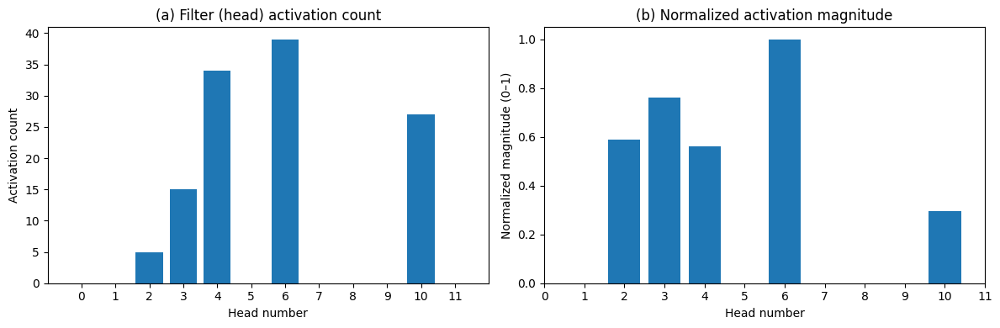

Top by count (head:count): [(6, 39), (4, 34), (10, 27), (3, 15), (2, 5)]
Top by magnitude (subset) (head:norm_mag): [(6, 1.0), (3, 0.7612311840057373), (2, 0.5899998545646667), (4, 0.5617103576660156), (10, 0.29577791690826416)]
Done (Fig. 9 style, (b) = exactly the heads from (a), max-normalized).


In [9]:
# === CELL — Fig. 9 (ViT): (a) head activation count  +  (b) normalized magnitude for THE SAME HEADS ===
# expects: vit_classifier, id2label_list, IMG_ROOT, DEVICE
#          load_and_preprocess_image(), forward_with_optional_head_kill()

import os, re, numpy as np, torch
from pathlib import Path
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (12,4)

TARGET_CLASS_FOLDER_HINT = "Red_winged_Blackbird"
MAX_IMAGES_PER_CLASS     = 40
TOPK_PER_IMAGE           = 3   # MC heads per image

def _norm_name(s: str):
    import re
    s = s.lower().replace("-", "_").replace(" ", "_")
    s = re.sub(r"[^a-z0-9_]", "", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

# ---------- resolve class folder ----------
class_dirs = [d for d in Path(IMG_ROOT).iterdir() if d.is_dir()]
hint_norm = _norm_name(TARGET_CLASS_FOLDER_HINT)
cands = [d for d in class_dirs if hint_norm in _norm_name(d.name)]
target_dir = cands[0] if cands else class_dirs[0]
print(f"[CLASS] Using folder: {target_dir.name}")

# ---------- map to classifier id ----------
id2label_norm = [_norm_name(x) for x in id2label_list]
folder_norm = _norm_name(target_dir.name.split(".", 1)[-1])
if folder_norm in id2label_norm:
    target_cls_idx = id2label_norm.index(folder_norm)
else:
    scores = []
    for i, lab in enumerate(id2label_norm):
        common = len(set(folder_norm.split("_")) & set(lab.split("_")))
        scores.append((common, -len(lab), i))
    scores.sort(reverse=True)
    target_cls_idx = scores[0][-1]
print(f"[CLASS] Mapped to classifier id={target_cls_idx} | name='{id2label_list[target_cls_idx]}'")

# ---------- collect images ----------
img_paths = []
for ext in ("*.jpg","*.jpeg","*.png"):
    img_paths += list(target_dir.rglob(ext))
img_paths = sorted(img_paths)[: (MAX_IMAGES_PER_CLASS or 10**9)]
print(f"[DATA] Images to analyze: {len(img_paths)}")

# ---------- stats over last-block heads ----------
vit_classifier.eval()
H = vit_classifier.blocks[-1].attn.num_heads
counts  = np.zeros(H, dtype=np.int32)      # (a)
mag_sum = np.zeros(H, dtype=np.float32)    # (b) sum over ONLY MC heads
mag_cnt = np.zeros(H, dtype=np.int32)

with torch.no_grad():
    for p in img_paths:
        x, _ = load_and_preprocess_image(p)
        x = x.to(DEVICE)

        base_logits, _, _ = forward_with_optional_head_kill(vit_classifier, x, kill_head_idx=None)
        base_tgt = base_logits[0, target_cls_idx].item()

        # per-head drops
        drops = np.zeros(H, dtype=np.float32)
        for h in range(H):
            logits_kill, _, _ = forward_with_optional_head_kill(vit_classifier, x, kill_head_idx=h)
            drops[h] = base_tgt - logits_kill[0, target_cls_idx].item()

        # MC heads for this image (positive drop only)
        order = np.argsort(-drops)
        mc_heads = [h for h in order.tolist() if drops[h] > 0][:TOPK_PER_IMAGE]

        # (a) counts
        for h in mc_heads:
            counts[h] += 1
        # (b) magnitude ONLY for the same MC heads
        for h in mc_heads:
            if drops[h] > 0:
                mag_sum[h] += drops[h]
                mag_cnt[h] += 1

# average positive magnitude (only where selected)
avg_mag = np.zeros(H, dtype=np.float32)
sel = mag_cnt > 0
avg_mag[sel] = mag_sum[sel] / mag_cnt[sel]

# ---- restrict (b) strictly to heads seen in (a) ----
subset = np.where(counts > 0)[0]

# Max-normalize on subset so even the smallest bar is visible
if len(subset) and avg_mag[subset].max() > 0:
    norm_mag_subset = avg_mag[subset] / (avg_mag[subset].max() + 1e-8)
else:
    norm_mag_subset = avg_mag[subset]

# --------------- plots ----------------
fig, ax = plt.subplots(1, 2, figsize=(12,4))

# (a) activation count
ax[0].bar(np.arange(H), counts)
ax[0].set_title("(a) Filter (head) activation count")
ax[0].set_xlabel("Head number")
ax[0].set_ylabel("Activation count")
ax[0].set_xticks(np.arange(H))

# (b) normalized magnitude ONLY for (a) heads
ax[1].bar(subset, norm_mag_subset)
ax[1].set_title("(b) Normalized activation magnitude")
ax[1].set_xlabel("Head number")
ax[1].set_ylabel("Normalized magnitude (0–1)")
ax[1].set_xticks(np.arange(H))

plt.tight_layout()
plt.show()

# helpful printouts
top_by_count = np.argsort(-counts[subset])[:5]
top_by_mag   = np.argsort(-norm_mag_subset)[:5]
print("Top by count (head:count):", [(int(subset[i]), int(counts[subset[i]])) for i in top_by_count])
print("Top by magnitude (subset) (head:norm_mag):", [(int(subset[i]), float(norm_mag_subset[i])) for i in top_by_mag])
print("Done (Fig. 9 style, (b) = exactly the heads from (a), max-normalized).")


# MI Step: Across ALL blocks of ViT

[Baseline] 135.136.Barn Swallow (0.985)
 Global boost caused FLIP -> 174.175.Pine Warbler (0.041)


/tmp/ipykernel_39/1025169412.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  heat = torch.tensor(heat).float().unsqueeze(0).unsqueeze(0)


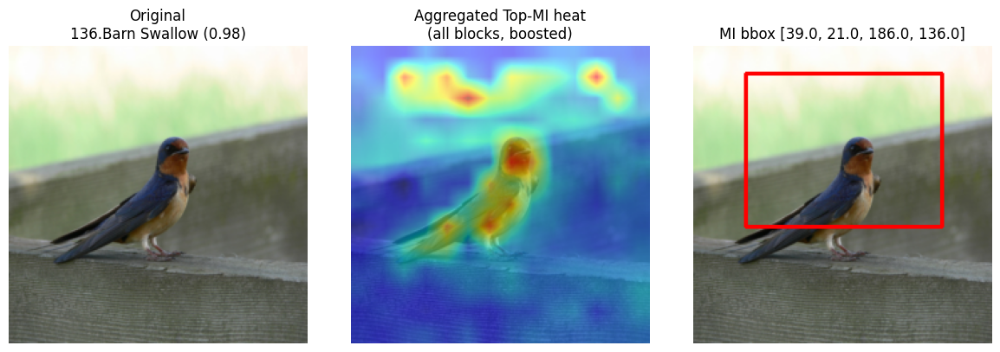

Summary:
Original class: 135.136.Barn Swallow (conf=0.98)
After boosting MI: 174.175.Pine Warbler (conf=0.04)
Flip happened? True
Δ original-class logit after boost: -11.0026
Boost plan (block -> heads):
  Block 0: heads [1, 6]
  Block 1: heads [2, 3]
  Block 2: heads [11, 2]
  Block 3: heads [11, 6]
  Block 4: heads [7, 6]
  Block 5: heads [9, 1]
  Block 6: heads [9, 10]
  Block 7: heads [10, 6]
  Block 8: heads [9, 10]
  Block 9: heads [3, 10]
  Block 10: heads [2, 3]
  Block 11: heads [9, 2]
→ These (block,head) pairs are jointly Most Influential (MI).


In [65]:
# CELL 5 — Multi-layer MI (Most Influential) across ALL blocks
# Output style: Original  |  Aggregated MI heat  |  Red bbox image

import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import random
from PIL import Image
import cv2
from matplotlib import cm
from torchvision.ops import masks_to_boxes

vit_classifier.eval()
vit_encoder_for_ae.eval()
ae_decoder.eval()

# ------------------------------------------------------------------
# Helpers for MI heat + overlay + bbox (MC-style visualization)
# ------------------------------------------------------------------

def mi_heads_to_heat(tokens_pre_norm, img_res=224):
    """
    Simple energy-based heatmap from boosted tokens.
    tokens_pre_norm: [1, N, D] (output of forward_vit_with_boost_plan)
    Returns: heat [H,W] in [0,1]
    """
    with torch.no_grad():
        x = tokens_pre_norm.squeeze(0)           # [N,D]
        energy = x.abs().mean(dim=1)            # [N]
        energy = energy[1:]                     # drop CLS token
        side = int(np.sqrt(energy.shape[0]))    # 14 for 224
        heat = energy.reshape(side, side)

        # normalize
        heat = (heat - heat.min()) / (heat.max() - heat.min() + 1e-6)

        heat = torch.tensor(heat).float().unsqueeze(0).unsqueeze(0)
        heat_up = F.interpolate(
            heat, size=(img_res, img_res),
            mode="bilinear", align_corners=False
        )
        return heat_up.squeeze().cpu().numpy()

def overlay_heat_MI(pil_img, heat, alpha_img=0.5, alpha_heat=0.5):
    base = np.array(pil_img.convert("RGB")) / 255.0
    cmap_rgb = cm.jet(heat)[..., :3]
    mix = alpha_img * base + alpha_heat * cmap_rgb
    return (np.clip(mix, 0, 1) * 255).astype(np.uint8)

def draw_MI_bbox(pil_img, heat, thr=0.6):
    mask = (heat >= thr).astype(np.uint8)
    if mask.sum() == 0:
        return np.array(pil_img), None
    box_xyxy = masks_to_boxes(torch.from_numpy(mask[None, ...]))[0].tolist()
    x1, y1, x2, y2 = [int(v) for v in box_xyxy]
    img_np = np.array(pil_img).copy()
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    # RED bbox for MI
    cv2.rectangle(img_bgr, (x1, y1), (x2, y2), (0, 0, 255), 2)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb, box_xyxy

# ------------------------------------------------------------------
# Low-level helper: run a single ViT block manually,
# with additive boost on a chosen subset of heads
# ------------------------------------------------------------------

def run_block_with_boost(block, x_in, boost_heads=None, boost_add=2.0):
    """
    block: one timm ViT block (has .norm1, .attn, .mlp, .norm2 etc.)
    x_in:  [B,N,D] tokens entering this block
    boost_heads: list[int] or None
        Which attention heads to "boost" in THIS block.
    boost_add: float
        Value we ADD into those head outputs. (not multiply)

    returns:
        x_out: [B,N,D] tokens after this block (residual+mlp)
    """

    # norm1 + attention math manually
    n1 = block.norm1(x_in)          # [B,N,D]
    attn_module = block.attn

    B_, N_, C_ = n1.shape
    H = attn_module.num_heads
    hd = attn_module.head_dim

    # qkv
    qkv = attn_module.qkv(n1)                      # [B,N,3*dim]
    qkv = qkv.reshape(B_, N_, 3, H, hd)
    qkv = qkv.permute(2, 0, 3, 1, 4)               # [3,B,H,N,hdim]
    q, k, v = qkv[0], qkv[1], qkv[2]               # each [B,H,N,hdim]

    attn_scores = (q @ k.transpose(-2, -1)) * attn_module.scale  # [B,H,N,N]
    attn_weights = attn_scores.softmax(dim=-1)                  # [B,H,N,N]
    attn_drop = attn_module.attn_drop(attn_weights)

    # base head output = A * V
    head_out = attn_drop @ v                                    # [B,H,N,hdim]

    # ADD boost on each chosen head:
    if boost_heads is not None:
        for h in boost_heads:
            if 0 <= h < head_out.shape[1]:
                head_out[:, h, :, :] = head_out[:, h, :, :] + boost_add

    # merge heads -> proj -> proj_drop
    out = head_out.transpose(1, 2).reshape(B_, N_, C_)           # [B,N,D]
    out = attn_module.proj(out)
    out = attn_module.proj_drop(out)

    # first residual
    x_res = x_in + out

    # mlp branch + second residual
    x_out = x_res + block.mlp(block.norm2(x_res))  # [B,N,D]

    return x_out

# ------------------------------------------------------------------
# Forward FULL ViT with a "boost plan"
# boost_plan is { block_index: [head_idx0, head_idx1, ...], ... }
# ------------------------------------------------------------------

def forward_vit_with_boost_plan(model, img_batch, boost_plan=None, boost_add=2.0):
    """
    model: vit_classifier (timm ViT)
    img_batch: [1,3,224,224] normalized
    boost_plan: dict[int, list[int]]
        keys are block indices (0..num_blocks-1),
        values are list of head indices in that block to boost
    boost_add: float
        how much to ADD to each boosted head's output feature

    returns:
        logits:          [1,C]
        tokens_pre_norm: [1,N,D] tokens just before final layer norm
    """

    m = model
    B = img_batch.shape[0]

    # patch embed + cls
    x = m.patch_embed(img_batch)              # [B, num_patches, dim]
    cls_tok = m.cls_token.expand(B, -1, -1)   # [B,1,dim]
    x = torch.cat([cls_tok, x], dim=1)        # prepend CLS
    x = x + m.pos_embed
    x = m.pos_drop(x)

    # walk all blocks, but inject per-block boost if requested
    for b_idx, blk in enumerate(m.blocks):
        heads_for_this_block = None
        if boost_plan is not None and b_idx in boost_plan:
            heads_for_this_block = boost_plan[b_idx]  # list[int]

        x = run_block_with_boost(
            blk,
            x,
            boost_heads=heads_for_this_block,
            boost_add=boost_add
        )

    tokens_pre_norm = x.clone()   # before final norm
    x_norm = m.norm(x)
    cls_final = x_norm[:, 0]      # CLS token
    logits = m.head(cls_final)    # [B,C]

    return logits, tokens_pre_norm

# ------------------------------------------------------------------
# Step helper: evaluate ONE head (one block+head) as MI candidate
# ------------------------------------------------------------------

@torch.no_grad()
def eval_single_head_MI(model, img_batch, block_index, head_index, base_idx, base_logit_val, boost_add):
    """
    Try boosting (block_index, head_index) alone.
    Return:
      flipped?
      new_pred_idx, new_pred_conf
      delta_orig (logit change on original class)
    """
    boost_plan = {block_index: [head_index]}

    logits_h, _ = forward_vit_with_boost_plan(
        model,
        img_batch,
        boost_plan=boost_plan,
        boost_add=boost_add
    )

    probs_h = logits_h.softmax(dim=1)
    conf_h, idx_h = probs_h.max(dim=1)
    conf_h = conf_h.item()
    idx_h  = idx_h.item()

    # how much original class logit changed
    new_logit_for_orig = logits_h[0, base_idx].item()
    delta_orig = new_logit_for_orig - base_logit_val  # negative = we hurt old class

    flipped = (idx_h != base_idx)

    return {
        "block": block_index,
        "head": head_index,
        "flipped": flipped,
        "pred_idx": idx_h,
        "pred_conf": conf_h,
        "delta_orig": delta_orig
    }

# ------------------------------------------------------------------
# Full MI analysis on ONE image across ALL blocks
# ------------------------------------------------------------------

@torch.no_grad()
def analyze_mi_multilayer(img_path, boost_add=2.0, topK_each_block=2):
    """
    Big picture:
      1. Baseline forward (no boost) -> get base class + confidence.
      2. For every block and every head in that block:
           - boost only that head
           - measure class flip?
           - measure how much it hurts original class logit
      3. Build MI set:
           Priority A: any heads that ALONE flip the class.
                       keep up to topK_each_block of those per block,
                       sorted by new class confidence desc.
           If a block has NO flipping head, fallback:
                       choose heads with most negative delta_orig
                       (hurt original class most) for that block.
      4. Combine all chosen heads from ALL blocks
         -> global boost_plan
      5. Run model with global boost_plan
         -> "counterfactual" prediction
      6. Reconstruct "counterfactual image" (placeholder) using tokens.
      7. Show original + MI heat + MI bbox + text summary.
    """

    # ---------- load img + preprocess ----------
    img_batch, pil_224 = load_and_preprocess_image(img_path)
    img_batch = img_batch.to(DEVICE)

    # ---------- BASELINE ----------
    base_logits, base_tokens = forward_vit_with_boost_plan(
        vit_classifier,
        img_batch,
        boost_plan=None,
        boost_add=boost_add
    )
    base_probs = base_logits.softmax(dim=1)
    base_conf, base_idx = base_probs.max(dim=1)
    base_conf = base_conf.item()
    base_idx  = base_idx.item()

    base_name = (
        id2label_list[base_idx]
        if base_idx < len(id2label_list)
        else f"class_{base_idx}"
    )

    base_logit_val = base_logits[0, base_idx].item()

    print(f"[Baseline] {base_idx}.{base_name} ({base_conf:.3f})")

    # ---------- SCAN EACH BLOCK / EACH HEAD ----------
    all_block_infos = {}  # b_idx -> list of head info dicts
    for b_idx, blk in enumerate(vit_classifier.blocks):
        H = blk.attn.num_heads
        per_block_list = []
        for h in range(H):
            info = eval_single_head_MI(
                vit_classifier,
                img_batch,
                block_index=b_idx,
                head_index=h,
                base_idx=base_idx,
                base_logit_val=base_logit_val,
                boost_add=boost_add
            )
            per_block_list.append(info)
        all_block_infos[b_idx] = per_block_list

    # ---------- BUILD boost_plan (global) ----------
    boost_plan = {}  # {block_index: [head,...]}

    for b_idx, head_list in all_block_infos.items():

        # priority A: heads that flip
        flipping_heads = [h for h in head_list if h["flipped"]]

        if len(flipping_heads) > 0:
            # sort by pred_conf DESC (strong flip first)
            flipping_heads.sort(key=lambda x: x["pred_conf"], reverse=True)
            chosen = flipping_heads[:topK_each_block]
        else:
            # fallback: most negative delta_orig (hurt base class most)
            head_list.sort(key=lambda x: x["delta_orig"])  # ascending => most negative first
            chosen = head_list[:topK_each_block]

        boost_plan[b_idx] = [c["head"] for c in chosen]

    # ---------- APPLY GLOBAL boost_plan ----------
    cf_logits, cf_tokens = forward_vit_with_boost_plan(
        vit_classifier,
        img_batch,
        boost_plan=boost_plan,
        boost_add=boost_add
    )
    cf_probs = cf_logits.softmax(dim=1)
    cf_conf, cf_idx = cf_probs.max(dim=1)
    cf_conf = cf_conf.item()
    cf_idx  = cf_idx.item()

    cf_name = (
        id2label_list[cf_idx]
        if cf_idx < len(id2label_list)
        else f"class_{cf_idx}"
    )

    # measure how bad we hurt the original class logit
    cf_logit_for_orig = cf_logits[0, base_idx].item()
    delta_orig_total = cf_logit_for_orig - base_logit_val  # negative => we destroyed old class

    flipped_final = (cf_idx != base_idx)

    if flipped_final:
        print(f" Global boost caused FLIP -> {cf_idx}.{cf_name} ({cf_conf:.3f})")
    else:
        print(f" Boosted MI plan but class stayed {base_idx}.{base_name}")
        print(f"   delta_orig(logit) = {delta_orig_total:.4f}")

    # ---------- simple decoder placeholder ----------
    def reconstruct_from_tokens(tokens_pre_norm, fallback_pil):
        """
        TODO:
            replace with real ae_decoder forward once wired.
            For now just return the original PIL so notebook won't break.
        """
        try:
            # example (future):
            # recon = ae_decoder(tokens_pre_norm)  # -> tensor -> to PIL
            recon = fallback_pil.copy()
        except Exception as e:
            print("Decoder reconstruction not implemented yet:", e)
            recon = fallback_pil.copy()
        return recon

    cf_pil = reconstruct_from_tokens(cf_tokens, pil_224)

    # ---------- NEW 3-PANEL MI VISUALIZATION (MC-style) ----------
    # 1) Heat from boosted tokens
    mi_heat = mi_heads_to_heat(cf_tokens, img_res=224)

    # 2) Overlay on original
    mi_overlay = overlay_heat_MI(pil_224, mi_heat, alpha_img=0.5, alpha_heat=0.5)

    # 3) BBox extraction (RED)
    mi_boxed, box_xyxy = draw_MI_bbox(pil_224, mi_heat, thr=0.8)

    fig, ax = plt.subplots(1, 3, figsize=(12, 4))

    ax[0].imshow(pil_224)
    ax[0].set_title(f"Original\n{base_name} ({base_conf:.2f})")
    ax[0].axis("off")

    ax[1].imshow(mi_overlay)
    ax[1].set_title("Aggregated Top-MI heat\n(all blocks, boosted)")
    ax[1].axis("off")

    ax[2].imshow(mi_boxed)
    ax[2].set_title(f"MI bbox {box_xyxy}" if box_xyxy else "MI bbox (none)")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

    # ---------- nice readable summary ----------
    print("Summary:")
    print(f"Original class: {base_idx}.{base_name} (conf={base_conf:.2f})")
    print(f"After boosting MI: {cf_idx}.{cf_name} (conf={cf_conf:.2f})")
    print(f"Flip happened? {flipped_final}")
    print(f"Δ original-class logit after boost: {delta_orig_total:.4f}")
    print("Boost plan (block -> heads):")
    for b_idx, heads in boost_plan.items():
        print(f"  Block {b_idx}: heads {heads}")

    if flipped_final:
        print("→ These (block,head) pairs are jointly Most Influential (MI).")
    else:
        print("→ These heads weaken the original class but did not fully flip.")

    return {
        "img_path": str(img_path),
        "orig_idx": base_idx,
        "orig_name": base_name,
        "orig_conf": base_conf,
        "cf_idx": cf_idx,
        "cf_name": cf_name,
        "cf_conf": cf_conf,
        "flipped": flipped_final,
        "delta_orig_total": delta_orig_total,
        "boost_plan": boost_plan,
        "orig_pil": pil_224,
        "cf_pil": cf_pil,
    }

# MAIN DEMO CALL

all_imgs = list((Path(CUB_ROOT) / "images").rglob("*.jpg"))
assert len(all_imgs) > 0, "No images in dataset."

demo_img = random.choice(all_imgs)

result_multi_MI = analyze_mi_multilayer(
    demo_img,
    boost_add=2.0,        # additive strength injected into MI heads for ALL layers
    topK_each_block=2     # from each block, take up to 2 "most influential" heads
)

# MI Heads identification (Random 5 images)

Total images: 11796 | Running MI on 5 random samples:

 - /kaggle/input/cub2002011/CUB_200_2011/images/112.Great_Grey_Shrike/Great_Grey_Shrike_0044_106851.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/103.Sayornis/Sayornis_0025_98620.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/087.Mallard/Mallard_0025_76465.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/094.White_breasted_Nuthatch/White_Breasted_Nuthatch_0120_85890.jpg
 - /kaggle/input/cub2002011/CUB_200_2011/images/091.Mockingbird/Mockingbird_0003_80833.jpg

================ RUNNING MI BATCH ================


---------- [1/5] /kaggle/input/cub2002011/CUB_200_2011/images/112.Great_Grey_Shrike/Great_Grey_Shrike_0044_106851.jpg ----------
[Baseline] 111.112.Great Grey Shrike (0.537)
 Global boost caused FLIP -> 17.018.Spotted Catbird (0.072)


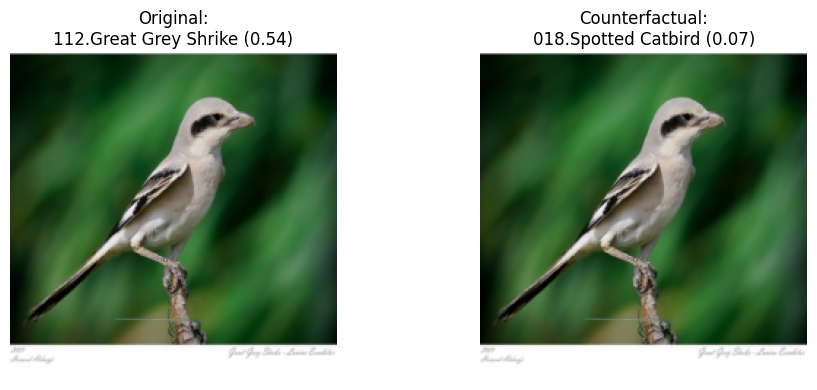

Summary:
Original class: 111.112.Great Grey Shrike (conf=0.54)
After boosting MI: 17.018.Spotted Catbird (conf=0.07)
Flip happened? True
Δ original-class logit after boost: -8.1307
Boost plan (block -> heads):
  Block 0: heads [0]
  Block 1: heads [11, 5]
  Block 2: heads [6, 3]
  Block 3: heads [8, 9]
  Block 4: heads [7, 3]
  Block 5: heads [7, 1]
  Block 6: heads [6, 3]
  Block 7: heads [2, 3]
  Block 8: heads [10, 1]
  Block 9: heads [4, 2]
  Block 10: heads [8, 9]
  Block 11: heads [2, 7]
→ These (block,head) pairs are jointly Most Influential (MI).

---------- [2/5] /kaggle/input/cub2002011/CUB_200_2011/images/103.Sayornis/Sayornis_0025_98620.jpg ----------
[Baseline] 102.103.Sayornis (0.972)
 Global boost caused FLIP -> 106.107.Common Raven (0.119)


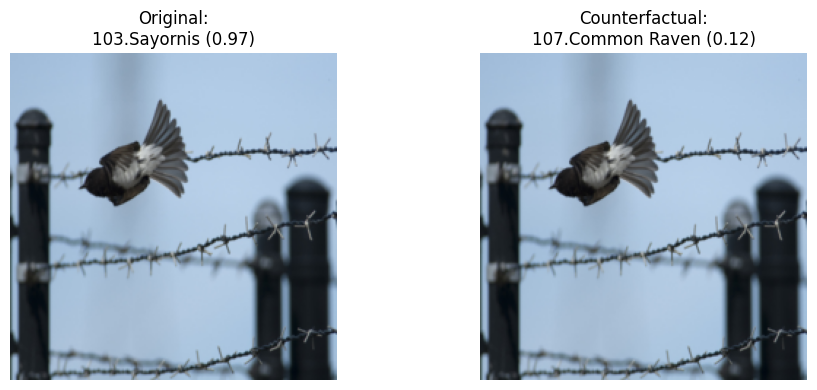

Summary:
Original class: 102.103.Sayornis (conf=0.97)
After boosting MI: 106.107.Common Raven (conf=0.12)
Flip happened? True
Δ original-class logit after boost: -14.5045
Boost plan (block -> heads):
  Block 0: heads [1, 11]
  Block 1: heads [2, 11]
  Block 2: heads [2, 6]
  Block 3: heads [5, 1]
  Block 4: heads [6, 4]
  Block 5: heads [11, 8]
  Block 6: heads [9, 8]
  Block 7: heads [11, 10]
  Block 8: heads [11, 9]
  Block 9: heads [11, 8]
  Block 10: heads [3, 9]
  Block 11: heads [2, 7]
→ These (block,head) pairs are jointly Most Influential (MI).

---------- [3/5] /kaggle/input/cub2002011/CUB_200_2011/images/087.Mallard/Mallard_0025_76465.jpg ----------
[Baseline] 86.087.Mallard (0.919)
 Global boost caused FLIP -> 57.058.Pigeon Guillemot (0.076)


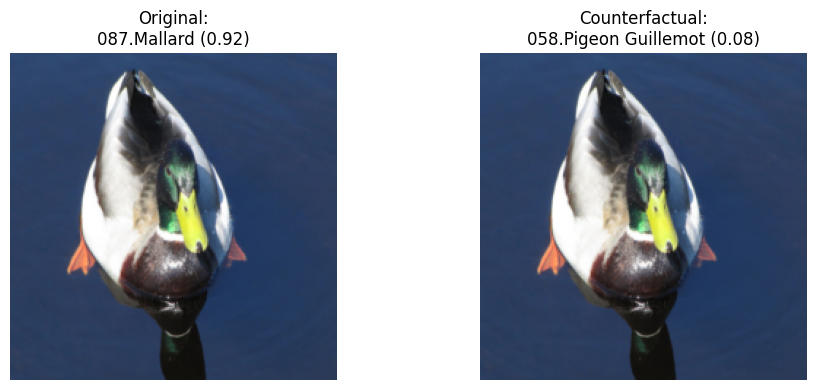

Summary:
Original class: 86.087.Mallard (conf=0.92)
After boosting MI: 57.058.Pigeon Guillemot (conf=0.08)
Flip happened? True
Δ original-class logit after boost: -7.5702
Boost plan (block -> heads):
  Block 0: heads [6, 1]
  Block 1: heads [2, 3]
  Block 2: heads [2, 11]
  Block 3: heads [6, 8]
  Block 4: heads [3, 1]
  Block 5: heads [7, 11]
  Block 6: heads [5, 3]
  Block 7: heads [9, 7]
  Block 8: heads [1, 8]
  Block 9: heads [3, 8]
  Block 10: heads [0, 10]
  Block 11: heads [9, 2]
→ These (block,head) pairs are jointly Most Influential (MI).

---------- [4/5] /kaggle/input/cub2002011/CUB_200_2011/images/094.White_breasted_Nuthatch/White_Breasted_Nuthatch_0120_85890.jpg ----------
[Baseline] 93.094.White breasted Nuthatch (0.960)
 Global boost caused FLIP -> 38.039.Least Flycatcher (0.103)


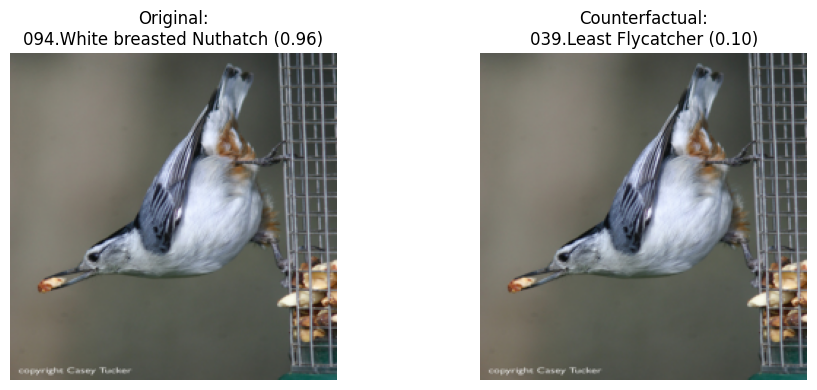

Summary:
Original class: 93.094.White breasted Nuthatch (conf=0.96)
After boosting MI: 38.039.Least Flycatcher (conf=0.10)
Flip happened? True
Δ original-class logit after boost: -11.4968
Boost plan (block -> heads):
  Block 0: heads [11, 8]
  Block 1: heads [8, 9]
  Block 2: heads [1, 11]
  Block 3: heads [3, 8]
  Block 4: heads [6, 9]
  Block 5: heads [8, 11]
  Block 6: heads [4, 8]
  Block 7: heads [11, 9]
  Block 8: heads [4, 10]
  Block 9: heads [6, 3]
  Block 10: heads [3, 2]
  Block 11: heads [2, 9]
→ These (block,head) pairs are jointly Most Influential (MI).

---------- [5/5] /kaggle/input/cub2002011/CUB_200_2011/images/091.Mockingbird/Mockingbird_0003_80833.jpg ----------
[Baseline] 90.091.Mockingbird (0.837)
 Global boost caused FLIP -> 5.006.Least Auklet (0.309)


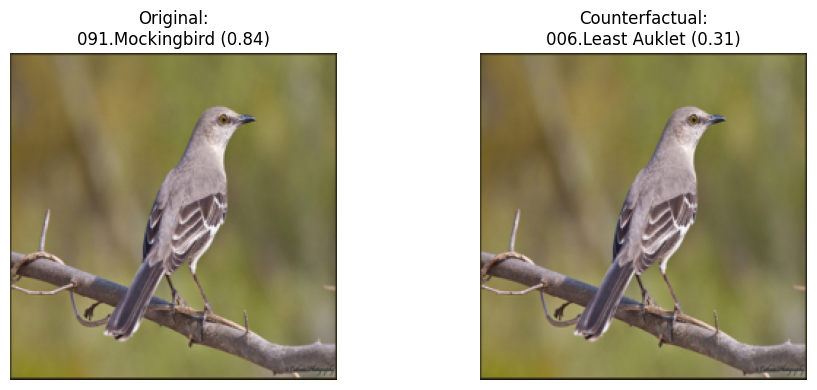

Summary:
Original class: 90.091.Mockingbird (conf=0.84)
After boosting MI: 5.006.Least Auklet (conf=0.31)
Flip happened? True
Δ original-class logit after boost: -9.7943
Boost plan (block -> heads):
  Block 0: heads [9, 8]
  Block 1: heads [5, 6]
  Block 2: heads [8, 11]
  Block 3: heads [5, 9]
  Block 4: heads [4, 7]
  Block 5: heads [2, 4]
  Block 6: heads [9, 11]
  Block 7: heads [10, 0]
  Block 8: heads [1, 0]
  Block 9: heads [10, 9]
  Block 10: heads [10, 4]
  Block 11: heads [9, 2]
→ These (block,head) pairs are jointly Most Influential (MI).

================ BATCH SUMMARY ================

Image: /kaggle/input/cub2002011/CUB_200_2011/images/112.Great_Grey_Shrike/Great_Grey_Shrike_0044_106851.jpg
  Baseline : 111.112.Great Grey Shrike (conf=0.54)
  After MI : 17.018.Spotted Catbird (conf=0.07)
  Flip?    : True
  Δorig-logit after boost: -8.1307
  MI heads per block (picked): {0: [0], 1: [11, 5], 2: [6, 3], 3: [8, 9], 4: [7, 3], 5: [7, 1], 6: [6, 3], 7: [2, 3], 8: [10, 1], 9: [

In [11]:

# CELL 6 — Multi-layer MI on 5 random images (ALL blocks)

# Uses analyze_mi_multilayer(...) from previous cell

import random
from pathlib import Path

# --- params you can tweak ---
N_IMAGES = 5            # how many random images
BOOST_ADD = 2.0         # additive boost strength per selected head
TOPK_EACH_BLOCK = 2     # pick up to K MI heads from EACH transformer block

# --- collect images ---
all_imgs = list((Path(CUB_ROOT) / "images").rglob("*.jpg"))
assert len(all_imgs) > 0, "No images found under CUB_200_2011/images"
chosen = random.sample(all_imgs, min(N_IMAGES, len(all_imgs)))

print(f"Total images: {len(all_imgs)} | Running MI on {len(chosen)} random samples:\n")
for p in chosen:
    print(" -", p)

batch = []
print("\n================ RUNNING MI BATCH ================\n")
for i, img_path in enumerate(chosen, 1):
    print(f"\n---------- [{i}/{len(chosen)}] {img_path} ----------")
    res = analyze_mi_multilayer(
        img_path,
        boost_add=BOOST_ADD,
        topK_each_block=TOPK_EACH_BLOCK,
    )
    batch.append(res)

# --- final text summary ---
print("\n================ BATCH SUMMARY ================\n")
for r in batch:
    orig = f"{r['orig_idx']}.{r['orig_name']} (conf={r['orig_conf']:.2f})"
    cf   = f"{r['cf_idx']}.{r['cf_name']} (conf={r['cf_conf']:.2f})"
    print(f"Image: {r['img_path']}")
    print(f"  Baseline : {orig}")
    print(f"  After MI : {cf}")
    print(f"  Flip?    : {r['flipped']}")
    print(f"  Δorig-logit after boost: {r['delta_orig_total']:.4f}")
    # (optional) compact boost plan preview
    heads_preview = {b: hs for b, hs in r['boost_plan'].items() if len(hs) > 0}
    print(f"  MI heads per block (picked): {heads_preview}\n")
print("=================================================\n")

# Decoder Active: Generate Counterfactual Images

AE decoder loaded. Ready for reconstruction.
[Baseline] 25.026.Bronzed Cowbird (0.814)
 Global MI boost caused FLIP -> 58.059.California Gull (0.074)
Δ original-class logit after boost: -11.1655


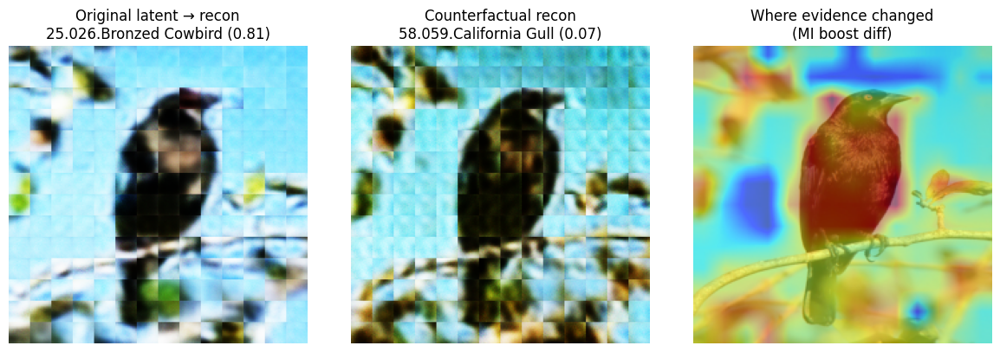

Summary:
Original class:    25.026.Bronzed Cowbird (conf=0.81)
After boosting MI: 58.059.California Gull (conf=0.07)
Flip happened?     True
Δ orig-class logit after boost: -11.165457248687744

Boost plan (block -> heads):
 Block 0: heads [11, 1]
 Block 1: heads [1, 11]
 Block 2: heads [11, 2]
 Block 3: heads [4, 2]
 Block 4: heads [3, 9]
 Block 5: heads [9, 1]
 Block 6: heads [10, 6]
 Block 7: heads [6, 7]
 Block 8: heads [7, 9]
 Block 9: heads [11, 7]
 Block 10: heads [7, 5]
 Block 11: heads [2, 1]

→ These (block,head) pairs are jointly Most Influential (MI). ✅
Done 


In [75]:
# CELL 6 — TRUE Visual Counterfactuals (MI boost across ALL blocks)


# Requirements before running:
# - vit_classifier          (your fine-tuned ViT classifier)
# - vit_classifier.eval()
# - DEVICE set
# - id2label_list defined
# - CUB_ROOT set
# - meta_ae.json / vit_ae_decoder.pt available + loaded path
#
# This cell will:
#   - load TinyMAEDecoder + weights
#   - find MI heads across ALL transformer blocks
#   - apply additive boost to those heads
#   - decode BOTH (baseline vs boosted) into images
#   - show ORIGINAL vs COUNTERFACTUAL vs HEATMAP
#
# If flip != True it's still valuable (you'll still see what changed).

import torch, torch.nn.functional as F
import numpy as np, math, json, random
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

vit_classifier.eval()
torch.set_grad_enabled(False)


# 0. Re-load AE decoder (TinyMAEDecoder) with weights


# You already trained this in AE notebook:
#   - meta_ae.json
#   - vit_ae_decoder.pt
#
# We'll recreate the same TinyMAEDecoder class here,
# load its state_dict, and move it to DEVICE.

class TinyMAEDecoder(torch.nn.Module):
    def __init__(self,
                 in_dim,
                 dec_dim,
                 depth,
                 heads,
                 num_patches,
                 patch,
                 out_ch):
        super().__init__()
        self.num_patches = num_patches
        self.patch = patch
        self.out_ch = out_ch

        self.proj_in = torch.nn.Linear(in_dim, dec_dim)

        layer = torch.nn.TransformerEncoderLayer(
            d_model=dec_dim,
            nhead=heads,
            dim_feedforward=dec_dim*4,
            dropout=0.0,
            activation='gelu',
            batch_first=True,
            norm_first=True
        )
        self.blocks = torch.nn.TransformerEncoder(layer, num_layers=depth)
        self.norm  = torch.nn.LayerNorm(dec_dim)

        # map each patch token -> flattened patch pixels
        self.head  = torch.nn.Linear(dec_dim, out_ch * patch * patch)

    def forward(self, tokens_all):
        # tokens_all: [B, 1+N, C] after final ViT norm
        # 1) drop CLS
        x = tokens_all[:, 1:, :]              # [B, N, C]
        x = self.proj_in(x)                   # [B, N, dec_dim]
        x = self.blocks(x)                    # [B, N, dec_dim]
        x = self.norm(x)
        x = self.head(x)                      # [B, N, out_ch*P*P]

        B, N, PP = x.shape
        P = self.patch
        # reshape patches -> image
        x = x.view(B, N, self.out_ch, P, P)   # [B, N, 3, P, P]
        h = w = int(math.sqrt(N))            # e.g. 14 for 224/16
        x = x.view(B, h, w, self.out_ch, P, P)  # [B,H',W',3,P,P]
        x = x.permute(0,3,1,4,2,5).contiguous() # [B,3,H',P,W',P]
        x = x.view(B, self.out_ch, h*P, w*P)    # [B,3,H,W]
        x = torch.sigmoid(x)                   # [0,1] image
        return x

# --- load meta (so decoder dims match training) ---
with open("/kaggle/input/vit-autoencoder/pytorch/default/1/meta_ae.json","r") as f:
    meta_ae = json.load(f)

IMG_SIZE      = int(meta_ae["img_size"])        # 224
PATCH_SIZE    = int(meta_ae["patch_size"])      # 16
N_PATCHES     = int(meta_ae["num_patches"])     # 196
EMBED_DIM     = int(meta_ae["embed_dim"])       # 768
DEC_DIM       = int(meta_ae["decoder_dim"])     # 512
DEC_DEPTH     = int(meta_ae["decoder_depth"])   # 4
DEC_HEADS     = int(meta_ae["decoder_heads"])   # 8
OUT_CH        = int(meta_ae["out_channels"])    # 3

ae_decoder = TinyMAEDecoder(
    in_dim=EMBED_DIM,
    dec_dim=DEC_DIM,
    depth=DEC_DEPTH,
    heads=DEC_HEADS,
    num_patches=N_PATCHES,
    patch=PATCH_SIZE,
    out_ch=OUT_CH
).to(DEVICE)

ae_state = torch.load("/kaggle/input/vit-autoencoder/pytorch/default/1/vit_ae_decoder.pt", map_location="cpu")
ae_decoder.load_state_dict(ae_state, strict=True)
ae_decoder.eval()

print("AE decoder loaded. Ready for reconstruction.")



# 1. Helper: run a SINGLE ViT block with additive boost on chosen heads
#    (same logic as before, but kept here self-contained)

def run_block_with_add_boost(blk, x_in, boost_heads=None, boost_add=2.0):
    """
    blk: transformer block from vit_classifier.blocks[b]
    x_in: [1,N,D] tokens entering THIS block (pre-norm)
    boost_heads: list[int] -> which attention heads to 'push'
    boost_add: scalar added to each selected head output
    """
    n1 = blk.norm1(x_in)                    # [1,N,D]
    attn_module = blk.attn
    B_, N_, C_ = n1.shape
    H = attn_module.num_heads
    hd = attn_module.head_dim

    # qkv
    qkv = attn_module.qkv(n1)               # [1,N,3*dim]
    qkv = qkv.reshape(B_, N_, 3, H, hd).permute(2,0,3,1,4)  # [3,1,H,N,hd]
    q, k, v = qkv[0], qkv[1], qkv[2]

    attn_scores  = (q @ k.transpose(-2,-1)) * attn_module.scale    # [1,H,N,N]
    attn_weights = attn_scores.softmax(dim=-1)
    attn_drop    = attn_module.attn_drop(attn_weights)

    head_out = attn_drop @ v           # [1,H,N,hd]

    # ADD boost on requested heads
    if boost_heads is not None and len(boost_heads) > 0:
        for h in boost_heads:
            if 0 <= h < head_out.shape[1]:
                head_out[:, h, :, :] = head_out[:, h, :, :] + boost_add

    # merge heads -> proj -> proj_drop
    out = head_out.transpose(1,2).reshape(B_, N_, C_)
    out = attn_module.proj(out)
    out = attn_module.proj_drop(out)

    # residual + MLP branch
    x2 = x_in + out
    x3 = x2 + blk.mlp(blk.norm2(x2))
    return x3  # [1,N,D]



# 2. Helper: full forward with per-block boost plan
#    returns logits and final tokens BEFORE final norm

def forward_classifier_with_blockwise_boost(
    model,
    img_batch,
    boost_plan,
    boost_add=2.0
):
    """
    boost_plan: dict {block_idx: [head_ids,...]}
    """
    m = model
    B = img_batch.shape[0]

    # ViT stem
    x = m.patch_embed(img_batch)
    cls_tok = m.cls_token.expand(B, -1, -1)
    x = torch.cat([cls_tok, x], dim=1)
    x = x + m.pos_embed
    x = m.pos_drop(x)

    # go block by block, injecting MI heads
    for b_idx, blk in enumerate(m.blocks):
        heads_for_block = boost_plan.get(b_idx, [])
        x = run_block_with_add_boost(
            blk,
            x,
            boost_heads=heads_for_block,
            boost_add=boost_add,
        )

    tokens_last = x.clone()   # [1,1+N,D] pre-final-norm

    # classifier head
    x_norm = m.norm(x)        # same LayerNorm used in training + AE tokens
    cls_final = x_norm[:,0]
    logits = m.head(cls_final)

    return logits, tokens_last



# 3. Utility: compute MI boost_plan (topK heads per block)

def build_mi_boost_plan(
    model,
    img_batch,
    base_idx,
    base_logit_val,
    boost_add=2.0,
    topK_each_block=2,
):
    """
    For each block b:
      try boosting each head h alone,
      measure how much it HURTS the original class logit.
    Pick topK_each_block most harmful heads.
    Return boost_plan: {block_idx: [head_ids,...]}
    """
    boost_plan = {}
    num_blocks = len(model.blocks)
    for b_idx in range(num_blocks):
        blk = model.blocks[b_idx]
        H = blk.attn.num_heads
        deltas = []

        for h in range(H):
            logits_h, _tok_h = forward_classifier_with_blockwise_boost(
                model,
                img_batch,
                boost_plan={b_idx:[h]},
                boost_add=boost_add
            )
            # how much original class got suppressed
            this_logit_base = logits_h[0, base_idx].item()
            delta_orig = this_logit_base - base_logit_val  # negative => hurts original class
            deltas.append((delta_orig, h))

        # choose most negative heads
        deltas.sort(key=lambda x: x[0])  # ascending
        chosen = [h for (d,h) in deltas[:topK_each_block]]
        boost_plan[b_idx] = chosen
    return boost_plan



# 4. Heatmap from token diff (where features changed spatially)

def tokens_to_change_heat(base_tokens, cf_tokens, img_size=224):
    """
    base_tokens / cf_tokens: [1,1+N,D] PRE-norm tokens.
    We'll:
      - drop CLS
      - |cf - base|
      - mean over channels
      - upsample (14x14 -> 224x224)
    """
    base_no_cls = base_tokens[:,1:,:]  # [1,N,D]
    cf_no_cls   = cf_tokens[:,1:,:]    # [1,N,D]

    diff = (cf_no_cls - base_no_cls).abs().mean(dim=2)  # [1,N]
    side = int(math.sqrt(diff.shape[1]))               # 14
    diff_map = diff.reshape(1,1,side,side).float()      # [1,1,14,14]

    up = F.interpolate(
        diff_map,
        size=(img_size, img_size),
        mode="bilinear",
        align_corners=False
    )[0,0]  # [224,224]

    mn, mx = up.min(), up.max()
    heat = (up - mn) / (mx - mn + 1e-6)
    return heat.cpu().numpy()

def overlay_heat_on_pil(pil_img, heat, alpha_img=0.5, alpha_heat=0.5):
    import matplotlib.cm as cm
    base = np.array(pil_img.convert("RGB"))/255.0
    cmap_rgb = cm.jet(heat)[...,:3]
    mix = alpha_img*base + alpha_heat*cmap_rgb
    mix = np.clip(mix, 0, 1)
    return (mix*255).astype(np.uint8)



# 5. MASTER: generate and visualize counterfactual

@torch.no_grad()
def generate_visual_counterfactual_FULL(
    img_path,
    boost_add=2.0,
    topK_each_block=2
):
    """
    - pick 1 image
    - run baseline
    - build MI boost_plan across ALL blocks
    - run boosted forward
    - decode baseline tokens and boosted tokens with mae decoder
    - plot Original-Recon vs Counterfactual-Recon vs ChangeHeat
    """

    # ---- load + preprocess ----
    img_batch, pil_224 = load_and_preprocess_image(img_path)
    img_batch = img_batch.to(DEVICE)

    # ---- BASELINE forward (no boost) ----
    base_logits, base_tokens_last = forward_classifier_with_blockwise_boost(
        vit_classifier,
        img_batch,
        boost_plan={},          # no MI
        boost_add=boost_add
    )
    base_probs = base_logits.softmax(dim=1)
    base_conf, base_idx = base_probs.max(dim=1)
    base_conf = base_conf.item()
    base_idx  = base_idx.item()
    base_name = (
        id2label_list[base_idx]
        if base_idx < len(id2label_list)
        else f"class_{base_idx}"
    )
    base_logit_val = base_logits[0, base_idx].item()

    print(f"[Baseline] {base_idx}.{base_name} ({base_conf:.3f})")

    # ---- Build MI boost plan across ALL blocks ----
    boost_plan = build_mi_boost_plan(
        vit_classifier,
        img_batch,
        base_idx=base_idx,
        base_logit_val=base_logit_val,
        boost_add=boost_add,
        topK_each_block=topK_each_block
    )

    # ---- MI BOOSTED forward ----
    cf_logits, cf_tokens_last = forward_classifier_with_blockwise_boost(
        vit_classifier,
        img_batch,
        boost_plan=boost_plan,
        boost_add=boost_add
    )

    cf_probs = cf_logits.softmax(dim=1)
    cf_conf, cf_idx = cf_probs.max(dim=1)
    cf_conf = cf_conf.item()
    cf_idx  = cf_idx.item()
    cf_name = (
        id2label_list[cf_idx]
        if cf_idx < len(id2label_list)
        else f"class_{cf_idx}"
    )
    flipped = (cf_idx != base_idx)

    cf_logit_base = cf_logits[0, base_idx].item()
    delta_base_class = cf_logit_base - base_logit_val  # (should be big negative if flip)

    if flipped:
        print(f" Global MI boost caused FLIP -> {cf_idx}.{cf_name} ({cf_conf:.3f})")
    else:
        print(f"✗ No full flip, stayed {cf_idx}.{cf_name} ({cf_conf:.3f})")
    print(f"Δ original-class logit after boost: {delta_base_class:.4f}")

    # ---- Decode BOTH baseline & counterfactual tokens ----
    # VERY IMPORTANT:
    # The decoder was trained on tokens AFTER final LayerNorm (vit_enc.norm),
    # exactly like vit_get_tokens() returned during AE training.
    # Our forward_classifier_with_blockwise_boost returned tokens_last PRE-norm.
    # So we must apply vit_classifier.norm(.) first before feeding to ae_decoder.
    #
    # tokens_for_dec: [B,1+N,D] AFTER norm
    tokens_base_norm = vit_classifier.norm(base_tokens_last)   # [1,1+N,768]
    tokens_cf_norm   = vit_classifier.norm(cf_tokens_last)     # [1,1+N,768]

    recon_base = ae_decoder(tokens_base_norm.to(DEVICE))  # [1,3,H,W] in [0,1]
    recon_cf   = ae_decoder(tokens_cf_norm.to(DEVICE))    # [1,3,H,W] in [0,1]

    # to PIL
    def tensor01_to_pil(timg_01):
        # timg_01: [3,H,W] in [0,1]
        arr = (timg_01.clamp(0,1).permute(1,2,0).cpu().numpy()*255).astype(np.uint8)
        return Image.fromarray(arr)

    pil_recon_base = tensor01_to_pil(recon_base[0])
    pil_recon_cf   = tensor01_to_pil(recon_cf[0])

    # ---- Heatmap of difference in latent space ----
    heat = tokens_to_change_heat(base_tokens_last, cf_tokens_last, img_size=IMG_SIZE)
    heat_overlay = overlay_heat_on_pil(pil_224, heat, alpha_img=0.5, alpha_heat=0.5)

    # ---- PLOT RESULT ----
    fig, ax = plt.subplots(1,3, figsize=(12,4))

    # Panel 1 = Original reconstruction (baseline latent)
    ax[0].imshow(pil_recon_base)
    ax[0].set_title(
        f"Original latent → recon\n{base_idx}.{base_name} ({base_conf:.2f})"
    )
    ax[0].axis("off")

    # Panel 2 = Counterfactual reconstruction (boosted latent)
    if flipped:
        ax[1].set_title(
            f"Counterfactual recon\n{cf_idx}.{cf_name} ({cf_conf:.2f})"
        )
    else:
        ax[1].set_title(
            f"Boosted recon (no flip)\n{cf_idx}.{cf_name} ({cf_conf:.2f})"
        )
    ax[1].imshow(pil_recon_cf)
    ax[1].axis("off")

    # Panel 3 = Heatmap of 'what changed'
    ax[2].imshow(heat_overlay)
    ax[2].set_title("Where evidence changed\n(MI boost diff)")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

    # ---- TEXT SUMMARY ----
    print("Summary:")
    print(f"Original class:    {base_idx}.{base_name} (conf={base_conf:.2f})")
    print(f"After boosting MI: {cf_idx}.{cf_name} (conf={cf_conf:.2f})")
    print("Flip happened?    ", flipped)
    print("Δ orig-class logit after boost:", delta_base_class)
    print("\nBoost plan (block -> heads):")
    for b_idx in range(len(vit_classifier.blocks)):
        print(f" Block {b_idx}: heads {boost_plan[b_idx]}")
    if flipped:
        print("\n→ These (block,head) pairs are jointly Most Influential (MI). ✅")
    else:
        print("\n→ These heads push the model toward another class,")
        print("  and the decoder shows how appearance is drifting. ❌/⚠")

    return {
        "img_path": str(img_path),
        "flipped": flipped,
        "orig_class": (base_idx, base_name, base_conf),
        "cf_class":   (cf_idx,  cf_name,  cf_conf),
        "boost_plan": boost_plan,
        "delta_base_class": delta_base_class,
    }



# 6. DEMO RUN


all_imgs = list((Path(CUB_ROOT)/"images").rglob("*.jpg"))
assert len(all_imgs) > 0, "No .jpg images found in CUB_200_2011/images"

demo_img = random.choice(all_imgs)
res_full = generate_visual_counterfactual_FULL(
    demo_img,
    boost_add=2.0,        # how strong we inject MI heads (additive)
    topK_each_block=2     # how many most-influential heads per block
)
print("Done ")